In [50]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import sklearn.datasets as skdata
from sklearn.model_selection import train_test_split
from sklearn.metrics import explained_variance_score
from math import floor
import seaborn as sns
import numpy as np
from joblib import dump, load

Constantes qui détermine comment le programme va se comporter :
- TESTING : Le programme va-t-il "fit" les IA et les tester?
- USESAVEDDATASET : Le programme va-t-il utiliser les datasets sauvegardés ou les rafraichirs
- REFRESHPLOT : Le programme va-il-rafraichir les plots des datasets

In [51]:
TESTING = False 
USESAVEDDATASET = True
REFRESHPLOTS = True

In [52]:
if USESAVEDDATASET:
    dataset_cal_housing = load("DataSave/dataset_cal_housing")
else:
    dataset_cal_housing = skdata.fetch_california_housing(data_home=None, download_if_missing=True, return_X_y=False, as_frame=True).frame
    dump(dataset_cal_housing, "DataSave/dataset_cal_housing") 

# Preparation du dataframe

In [53]:
def GetTestAndTrain(dataset):
    train_Set, test_Set = train_test_split(dataset, test_size=0.2)

    x_Test = test_Set.drop("MedHouseVal", axis = 1)
    y_Test = test_Set["MedHouseVal"]
    x_Train = train_Set.drop("MedHouseVal", axis = 1)
    y_Train = train_Set["MedHouseVal"]
    return x_Test, y_Test, x_Train, y_Train

In [54]:
if TESTING:
    x_Test, y_Test, x_Train, y_Train = GetTestAndTrain(dataset=dataset_cal_housing)

# ISSUES DETECTION
Detects any suspiscious clamp

In [55]:

def DetectIssue(datas, lambdaFilter):
    _Data = lambdaFilter(datas)
    count_of_value = 0
    for data in datas:
        if (data == _Data):
            count_of_value += 1
    return _Data, count_of_value

def DetectAllIssues(dataset, lambdaFilter, text, _concerned_percentage_by_issue=4.8e-4):
    for keys in dataset:
        _value_of_data, count_of_same_value = DetectIssue(dataset[keys], lambdaFilter)
        if (count_of_same_value > _concerned_percentage_by_issue * len(dataset[keys])):
            print(count_of_same_value, " elements of ", keys, text, _value_of_data)

DetectAllIssues(dataset_cal_housing, lambda _List : max(_List), ":\n have the same value being the maximum of the grid : ")
print("\n")
DetectAllIssues(dataset_cal_housing, lambda _List : min(_List), ":\n have the same value being the minimum of the grid : ")

49  elements of  MedInc :
 have the same value being the maximum of the grid :  15.0001
1273  elements of  HouseAge :
 have the same value being the maximum of the grid :  52.0
965  elements of  MedHouseVal :
 have the same value being the maximum of the grid :  5.00001


12  elements of  MedInc :
 have the same value being the minimum of the grid :  0.4999


# Analyse des Valeurs anormales

Analyser la distance par rapport à la médiane de chaque table et filtrer ou ajouter une table contenant cette distance à la médiane est une solution.
Nous ne l'avons pas explorée.

PS : Cette logique avec la "Longitude" ou "Latitude" n'a aucun sens car qu'importe leurs valeurs, elles ne peuvent pas être considérés comme aberrante

# Data Gestion functions

    Permet de supprimmer les valeurs aberrantes (non utilisé dans les datasets)

In [56]:
def ReturnDatasetDeletedAtIndex(dataset, index):
    """Deletes at index in dataset"""
    for keys in dataset:
        del dataset[keys][index]
    return dataset

In [57]:
def ReturnFilteredDataset(dataset, dataKey, Filter = lambda x : False):
    """"Filter All The Dataset with filter lambda"""
    for index in range(len(dataset[dataKey]), -1, ):
        if Filter(dataset[dataKey][index]):
            dataset = ReturnDatasetDeletedAtIndex(dataset, index)
    return dataset

# Regression TEST

Pourquoi la Regression : Nous nous sommes basé sur sur la scikit-learn algorithm cheat-sheet

## Qu'est-ce qu'une structure ensembliste
les structures ensemblistes ont pour fonctionnement de créer plusieurs prédictions différentes afin d'en faire une moyenne pour une prédiction finale. Il ont pour ça un "estimator" qui est généralement un arbre de décision.
On trouve dans cet ensemble des algorithmes que l'on retrouvera plus tard:
- RandomForestRegressor : création d'une très grande quantité d'arbres de décision totalement aléatoire et les sélectionne en fonction de leur résultats
- ExtraTreesRegressor : de même pour le RandomForestRegressor mais va utiliser les ExtraTree (une arbre de décision consu pour les modèles ensembliste dont la création d'un nouveau noeud va se faire parmis le meilleurs choix d'un tirage aléatoire) en arbre de décision.
- GradientBoostingRegressor : se sert d'un calcul de perte par rapport à ses prédictions sur ses données d'entrainement pour construire son ensemble de modèle.
- HistGradientBoostingRegressor : Version plus optimisé du GradientBoostingRegressor, gère les données sans valeurs et va trier les 
données plus rapidement.

Dans ces ensembles on peut trouver des boosts dont leur but est de booster sont estimator qui peut être lui même ou n'importe quel autre, y compris un autre algorithme ensembliste
- AdaBoostRegressor : entraine d'abord son estimator avec le dataset original puis va essayer d'ajouter des poids d'importances sur les données à entrainer et regarder la différence d'ameilioration ou non de l'ia
- BaggingRegressor : entraine plein d'estimator sur des portions aléatoires du dataset et regroupe ensuites les prédictions.
A noter donc que les différences entre l'Adaboost et le Bagging est que l'Adaboost va pouvoir mieux gérer les exeptions tandis que le Bagging lui va faire ressortir les généralités



In [58]:

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import learning_curve

**1) Import all regressors**

In [59]:
from importlib import import_module
import sklearn

def GetAllRegressors():
    regressors=[]
    for module in sklearn.__all__:
        try:
            module = import_module(f'sklearn.{module}')
            regressors.extend([getattr(module,cls) for cls in module.__all__  if 'Regress' in cls ])
        except:
            pass
    regressors.append(sklearn.svm.SVR)
    return regressors
if TESTING:
    regressors = GetAllRegressors()

**2)3) Fit and Filter**

In [109]:
def CreatedListOfFilteredAndFittedRegressor(regressors_list, x_Train_List, y_Train_List, softDebug=False):
    regressor_fitted_list = list()
    skip = False
    for reg in regressors_list:
        for base in reg.__bases__:
            if base.__name__ == "_BaseVoting" or base.__name__ == "_BaseStacking" or base.__name__ == "BaseEstimator" or base.__name__ == "_MultiOutputEstimator" or base.__name__ == "_BaseChain" or base.__name__ == "_GeneralizedLinearRegressor":
                skip = True
                continue
        if not skip and not reg.__name__ == "KNeighborsRegressor" and not reg.__name__ == "RadiusNeighborsRegressor":
            regressor_fitted_list.append(reg().fit(x_Train_List, y_Train_List))
        skip = False
    print(len(regressor_fitted_list), " Regressor Used", end="\r" if softDebug else "\n")
    return regressor_fitted_list
if TESTING:
    regressor_fitted = CreatedListOfFilteredAndFittedRegressor(regressors, x_Train, y_Train)

**4) Predict**

In [112]:
def GetDictPrediciton(fitted_regressor_list, x_Test_list, y_Test_list, boosting=False, alphaboosting=False, stacking=False, softDebug=False):
    regressor_predict_dict= {"Regressor" : list(), "Score" : list()}
    for reg in fitted_regressor_list:
        try:
            test = reg.predict(x_Test_list)
        except:
            regressor_predict_dict["Regressor"].append(reg.base_estimator_.__class__.__name__)
            regressor_predict_dict["Score"].append(0)
            continue
        if boosting == False:
            regressor_predict_dict["Regressor"].append(reg.__class__.__name__)
        elif alphaboosting:
            regressor_predict_dict["Regressor"].append(reg.base_estimator_.base_estimator.__class__.__name__)
        elif stacking:
            regressor_predict_dict["Regressor"].append(reg.final_estimator_.__class__.__name__)
        else:
            regressor_predict_dict["Regressor"].append(reg.base_estimator_.__class__.__name__)
        regressor_predict_dict["Score"].append(max(0, explained_variance_score(y_Test_list, test)))
        print(regressor_predict_dict["Regressor"][-1], "score :", regressor_predict_dict["Score"][-1], sep=" ", end="\r" if softDebug else "\n")

    return regressor_predict_dict
if TESTING:
    regressor_predict_dict = GetDictPrediciton(regressor_fitted, x_Test, y_Test)

**5) Draw Table**

In [62]:
def PrintRegressorDictBarplot(regressors_predict_dict):
    d = pd.DataFrame(regressors_predict_dict)
    magic = sns.barplot(data=d, x="Regressor", y="Score")
    for item in magic.get_xticklabels():
        item.set_rotation(90)
if TESTING:
    PrintRegressorDictBarplot(regressor_predict_dict)

**6) AdaBoost the regressors**

In [63]:
from sklearn.ensemble import AdaBoostRegressor
def CreateAdabostedFittedFromRegList(regressor_fitted_list, x_Train_list, y_Train_list):
    AdaBoost_fitted_list = list()
    for regressor in regressor_fitted_list:
        AdaBoost_fitted_list.append(AdaBoostRegressor(regressor).fit(x_Train_list, y_Train_list))
        print("Regressor :", regressor.__class__.__name__, "fitted done.", sep=" ", end="\n")
    return AdaBoost_fitted_list

In [64]:
if TESTING:
    AdaBoost_fitted_list = CreateAdabostedFittedFromRegList(regressor_fitted, x_Train, y_Train)

In [65]:
if TESTING:
    AdaBoost_dict = GetDictPrediciton(AdaBoost_fitted_list, x_Test, y_Test, boosting=True)

In [66]:
if TESTING:
    PrintRegressorDictBarplot(AdaBoost_dict)

In [67]:
from sklearn.ensemble import BaggingRegressor

def CreateBaggingFittedFromRegList(regressor_fitted_list, x_Train_list, y_Train_list):
    Bagging_fitted_list = list()
    for regressor in regressor_fitted_list:
        Bagging_fitted_list.append(BaggingRegressor(regressor).fit(x_Train_list, y_Train_list))
        print("Regressor :", regressor.__class__.__name__, "fitted done.", sep=" ", end="\n")
    return Bagging_fitted_list
if TESTING:
    Bagging_fitted_list = CreateBaggingFittedFromRegList(regressor_fitted, x_Train, y_Train)

In [68]:
if TESTING:
    Bagging_dict = GetDictPrediciton(Bagging_fitted_list, x_Test, y_Test, boosting=True)

In [69]:
if TESTING:
    PrintRegressorDictBarplot(Bagging_dict)

In [117]:
def GetBestScoreWithPredictDict(regressor_dict):
    maxi = {"Regressor" : "none", "Score" : 0}
    for index in range(len(regressor_dict["Regressor"])):
        if regressor_dict["Score"][index] > maxi["Score"]:
            maxi["Regressor"], maxi["Score"] = regressor_dict["Regressor"][index], regressor_dict["Score"][index]
    return maxi

In [123]:
def SoftTestForDataset(datasetToTest, softDebug=True):
    x_Te, y_Te, x_Tr, y_Tr = GetTestAndTrain(dataset=datasetToTest)
    rgrssrs = GetAllRegressors()
    # Normal Tests
    rgrssr_fttd = CreatedListOfFilteredAndFittedRegressor(rgrssrs, x_Tr, y_Tr, softDebug=softDebug)
    rgrssr_prdct_dct = GetDictPrediciton(rgrssr_fttd, x_Te, y_Te, softDebug=softDebug)
    if not softDebug:
        PrintRegressorDictBarplot(rgrssr_prdct_dct)
    return GetBestScoreWithPredictDict(rgrssr_prdct_dct)

In [71]:
def CompleteTestForDataset(datasetToTest):
    x_Te, y_Te, x_Tr, y_Tr = GetTestAndTrain(dataset=datasetToTest)
    rgrssrs = GetAllRegressors()
    # Normal Tests
    print("Normal Regressor Test")
    rgrssr_fttd = CreatedListOfFilteredAndFittedRegressor(rgrssrs, x_Tr, y_Tr)
    del rgrssrs
    rgrssr_prdct_dct = GetDictPrediciton(rgrssr_fttd, x_Te, y_Te)
    del rgrssr_fttd
    PrintRegressorDictBarplot(rgrssr_prdct_dct)
    del rgrssr_prdct_dct
    # Adaboosted regressor tests
    print("Adaboosted regressor Test")
    AdaBoost_fttd_lst = CreateAdabostedFittedFromRegList(rgrssr_fttd, x_Tr, y_Tr)
    AdaBoost_dct = GetDictPrediciton(AdaBoost_fttd_lst, x_Te, y_Te, boosting=True)
    del AdaBoost_fttd_lst
    PrintRegressorDictBarplot(AdaBoost_dct)
    del AdaBoost_dct
    # Bagging regressor
    print("Bagging regressor Test")
    Bagging_fttd_lst = CreateBaggingFittedFromRegList(rgrssr_fttd, x_Tr, y_Tr)
    del rgrssr_fttd
    Bagging_dct = GetDictPrediciton(Bagging_fttd_lst, x_Te, y_Te)
    PrintRegressorDictBarplot(Bagging_dct)
    del Bagging_dct
    print("Adaboost On Bagging Test")
    Final_AdaBoost_fttd_lst = CreateAdabostedFittedFromRegList(Bagging_fttd_lst, x_Tr, y_Tr)
    del Bagging_fttd_lst
    Final_AdaBoost_dct = GetDictPrediciton(Final_AdaBoost_fttd_lst, x_Te, y_Te, boosting=True, alphaboosting=True)
    PrintRegressorDictBarplot(Final_AdaBoost_dct)

**7) Stacking Regressor on best results : >0.7**

In [72]:
from sklearn.ensemble import StackingRegressor

In [73]:
if TESTING:
    Best_Regressors_List = list()
    for indexRegressor in range(len(AdaBoost_fitted_list)):
        if AdaBoost_dict["Score"][indexRegressor] > 0.7:
            Best_Regressors_List.append((AdaBoost_fitted_list[indexRegressor].base_estimator_.__class__.__name__, AdaBoost_fitted_list[indexRegressor]))
            print("Regressor :", AdaBoost_fitted_list[indexRegressor].base_estimator.__class__.__name__, "Added to the stacking list", sep=" ", end="\n")


In [74]:
if TESTING:
    StackingOnRegressorFitted = list()
    for reg in regressors:
        
        for base in reg.__bases__:
            if base.__name__ == "_BaseVoting" or base.__name__ == "_BaseStacking" or base.__name__ == "BaseEstimator" or base.__name__ == "_MultiOutputEstimator" or base.__name__ == "_BaseChain" or base.__name__ == "_GeneralizedLinearRegressor":
                skip = True
                continue
        if not skip and not reg.__name__ == "KNeighborsRegressor" and not reg.__name__ == "RadiusNeighborsRegressor":
            try:
                StackingOnRegressorFitted.append(StackingRegressor(Best_Regressors_List, final_estimator=reg()).fit(x_Train, y_Train))
            except:
                skip = False
                continue
            print("Finished the fitting of Stacking of bestregressorlist with", reg.__name__, sep=" ", end="\n" )
        

In [75]:
if TESTING:
    StackingPredictDict = GetDictPrediciton(StackingOnRegressorFitted, x_Test, y_Test, boosting=True, stacking=True)

In [76]:
if TESTING:
    PrintRegressorDictBarplot(StackingPredictDict)

# Hyperparameters Test with Halving Random Search CV

In [77]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingRandomSearchCV

**Function**

In [78]:

def GetBestParametersHalving(regressor, param_halving, cv = 3):

    halving = HalvingRandomSearchCV(estimator=regressor, param_distributions=param_halving, scoring='r2', cv = cv, n_jobs=3).fit(x_Train, y_Train)
    
    print(" Results from Halving Random Search " )
    print("\n Score:",halving.best_score_)
    print("\n Params:\n",halving.best_params_)
    return halving.best_params_


**HistGradientBoost**

In [79]:
from sklearn.ensemble import HistGradientBoostingRegressor

HGBR = HistGradientBoostingRegressor(random_state=0)
print()

HistGradient_test_params = {'learning_rate': list(np.arange(0.08, 0.2, 0.01)),
    'max_leaf_nodes' : list(range(15, 50, 1)), # [31],
    'max_depth' : list(range(10, 25, 1)),
    'min_samples_leaf' : list(range(10, 25, 1)),
    'random_state' : [0]}
if TESTING:
    GetBestParametersHalving(HGBR, HistGradient_test_params)



**Analyse**

Pas concluant, souvent des résultats en dessous du résultat de base

# CREATE A SUBPLOT WITH INDEX
**GetColorsList** returns the color list for each value to show in the SubPlot
**CreateSubPlot** creates sub plot with given variables

In [80]:
def GetColorsList(dataset, colorsToUse=["blue", "red"], specialKey="MedHouseVal"):
    allColors = list()
    nbOfCategories = len(colorsToUse)-1
    maxValue = max(dataset[specialKey])
    minValue = min(dataset[specialKey])
    diff = maxValue - minValue
    steps = diff / nbOfCategories
    # print("nbOfCategories", nbOfCategories, "maxValue", maxValue, "minValue", minValue, "diff", diff, "steps", steps, sep="\n")
    for value in dataset[specialKey]:
        allColors.append(colorsToUse[floor(value/steps)])
    return allColors

def CreateSubPlot(dataset, x, y, subplotIndex, specialDataKey="MedHouseVal", xlabel="x", ylabel="y", title="title", colorsPalette=["yellow", "green", "cyan", "blue", "purple", "red"]):
    colors = colorsPalette
    colorList = GetColorsList(dataset, colorsToUse=colors, specialKey=specialDataKey)
    # on créer le subplot
    plt.subplot(subplotIndex)
    plt.scatter(x, y, color=colorList, marker='o', s=1, label=None, alpha=0.7)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    # on affiche la légende
    patchList = list()
    for nb in range(len(colors)):
        patchList.append(mpatches.Patch(color=colors[nb], label=str(nb)))
    plt.legend(title=specialDataKey, handles=patchList, loc="center left", bbox_to_anchor=(1, 0.5))

# CreateSubPlot(dataset_cal_housing["Latitude"], dataset_cal_housing["Longitude"], 321, specialDataKey="MedHouseVal", xlabel='Latitude', ylabel='Longitude', title='Prix en fonction de la localisation')

# CreateAllSubPlotWithKey
Iterates through the dataset to create all subplot configuration with given key and the rest of the keys of dataset

In [81]:
def CreateAllSubPlotWithKey(dataset, recurrentKey, mainKey, colorsPaletteList=["yellow", "green", "cyan", "blue", "purple", "red"], SubPlotIndex = 331):
    fig, axs = plt.subplots(3, 3, figsize=(12, 10))
    fig.suptitle(mainKey, fontsize=35)
    for key in dataset:
        if key == mainKey:
            continue
        # plt.clf()
        CreateSubPlot(dataset, dataset[mainKey], dataset[key], SubPlotIndex, specialDataKey=recurrentKey, xlabel=mainKey, ylabel=key, title=mainKey+" et "+key, colorsPalette=colorsPaletteList)
        SubPlotIndex+=1
    plt.tight_layout()

# CreateAllSubPlotWithKey(dataset_cal_housing, "MedHouseVal", "MedInc", colorsPaletteList=["yellow", "green", "cyan", "blue", "purple", "red"])

# CreateAllPlotOfDatabase
Iterates through the dataset to create all combinations of subPlot

In [82]:
def CreateAllPlotOfDatabase(dataset, recurrentKey, colorsPaletteList=["yellow", "green", "cyan", "blue", "purple", "red"], StartSubPlotIndex = 331):
    for Mainkey in dataset:
        CreateAllSubPlotWithKey(dataset, recurrentKey, Mainkey, colorsPaletteList=colorsPaletteList, SubPlotIndex=StartSubPlotIndex)

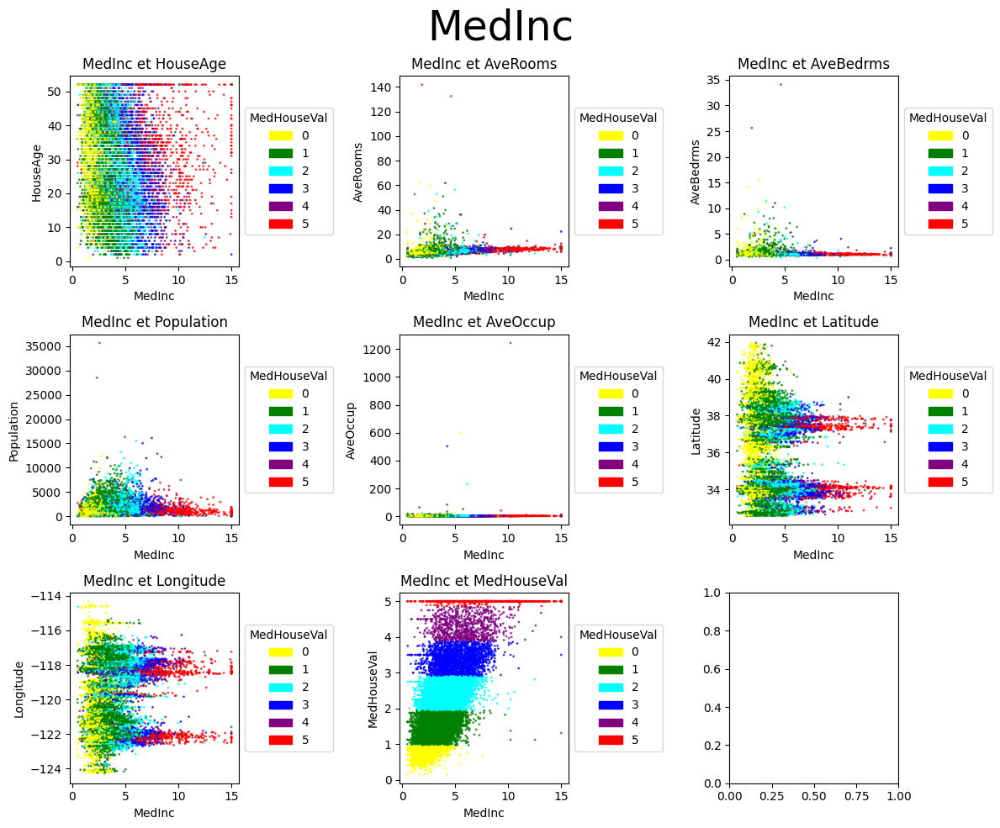

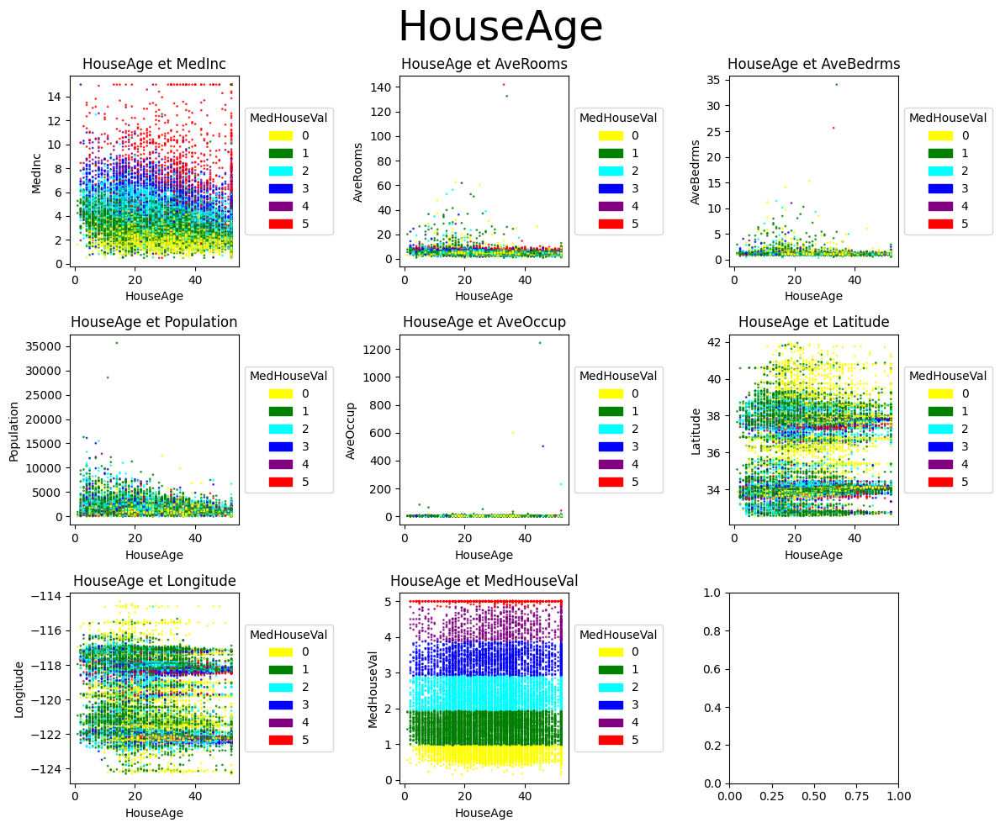

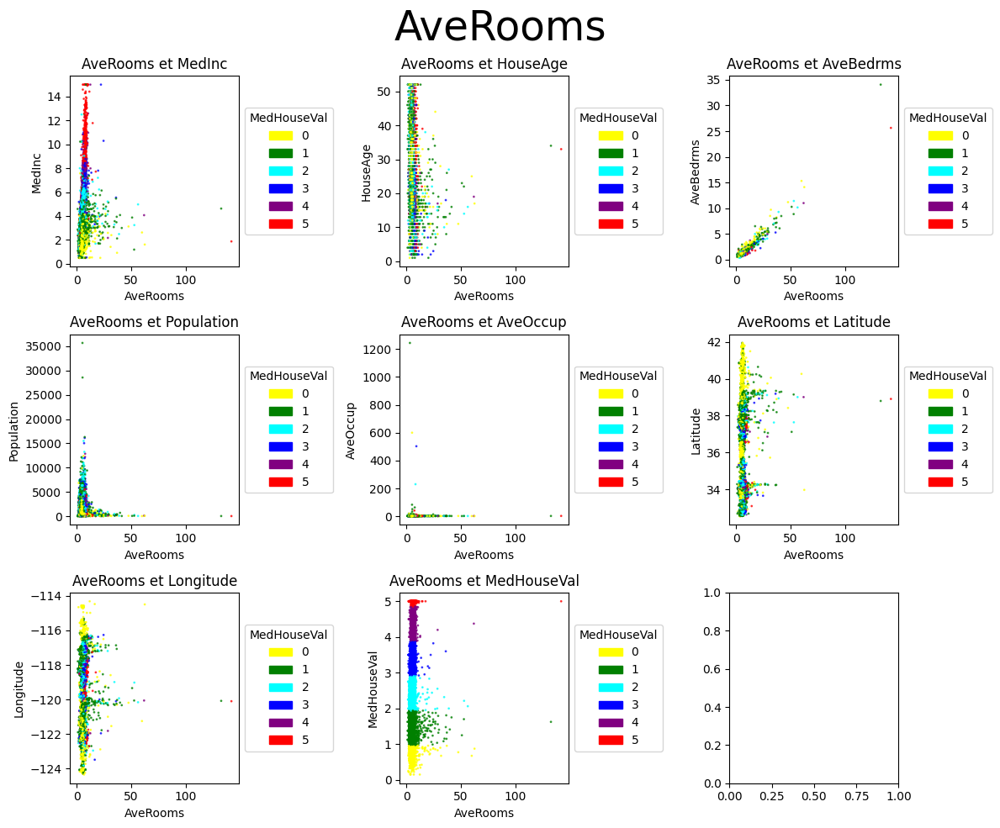

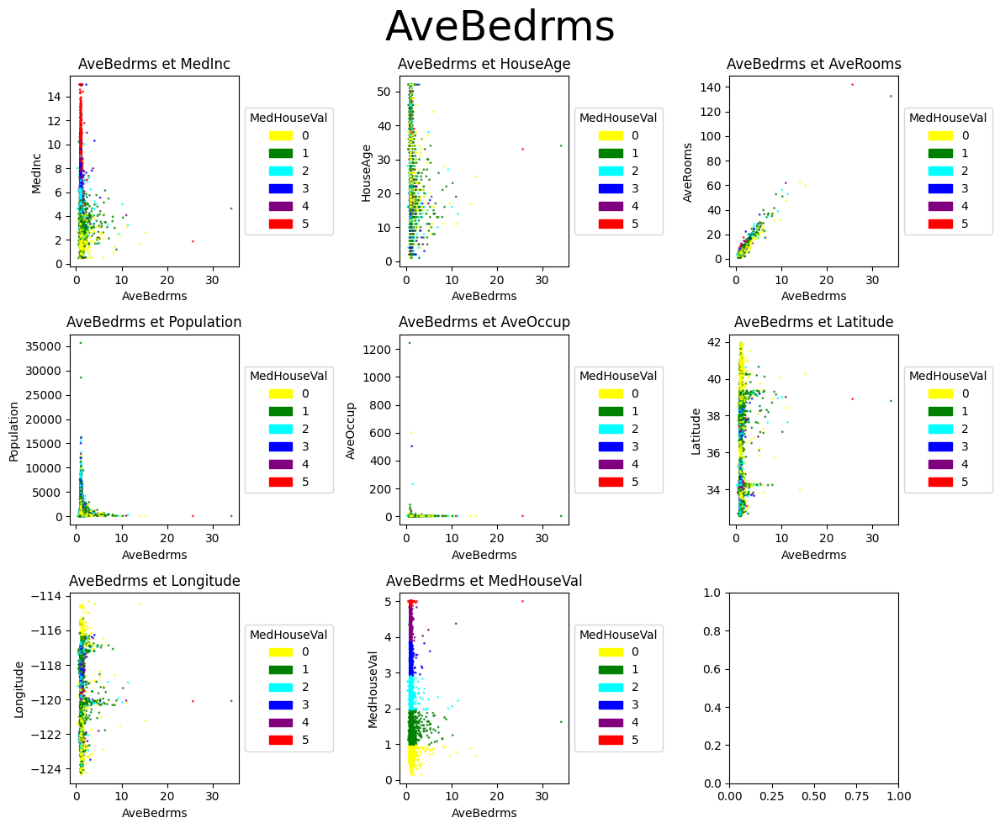

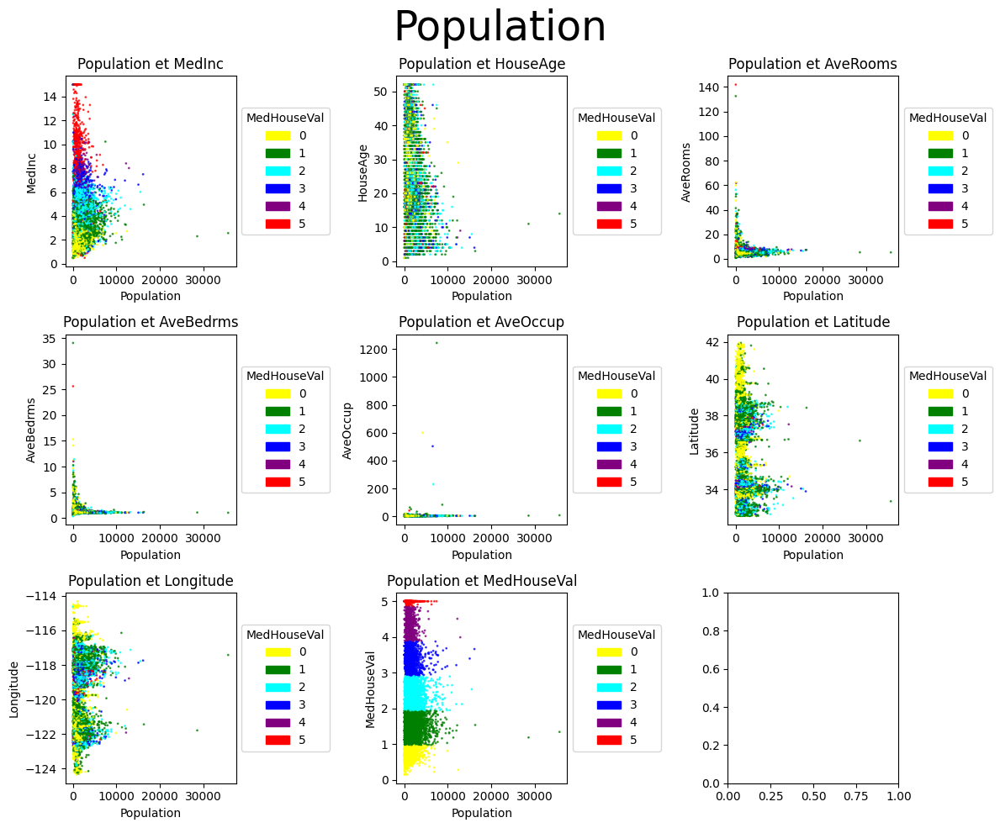

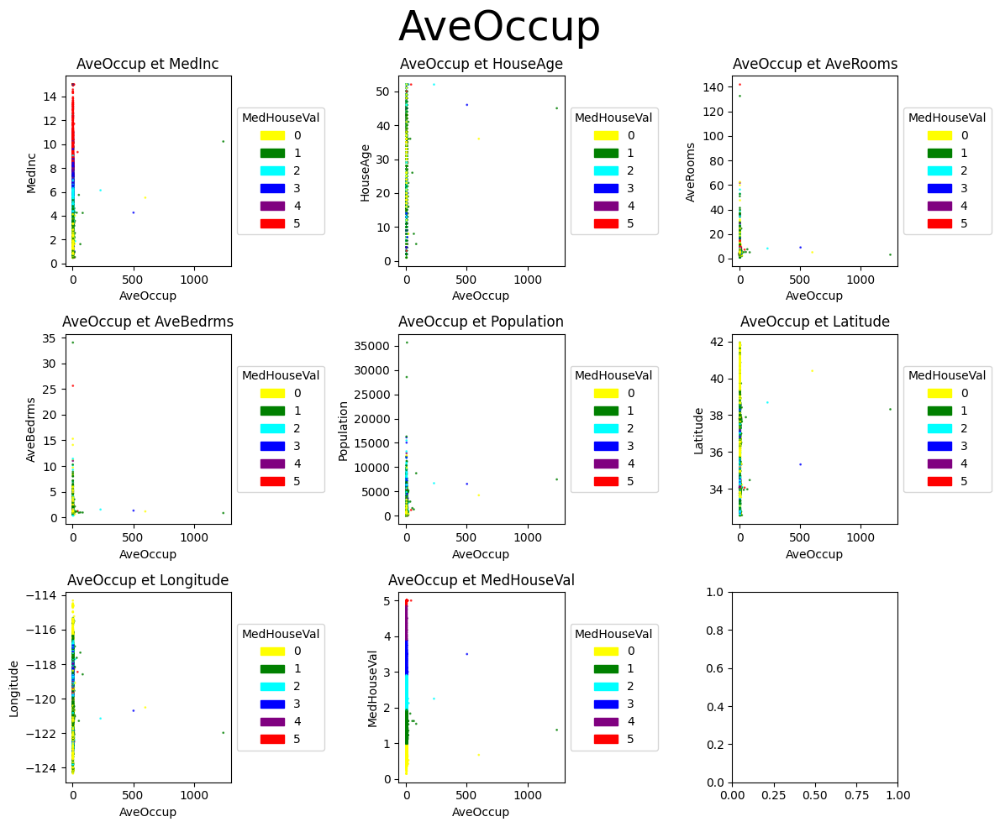

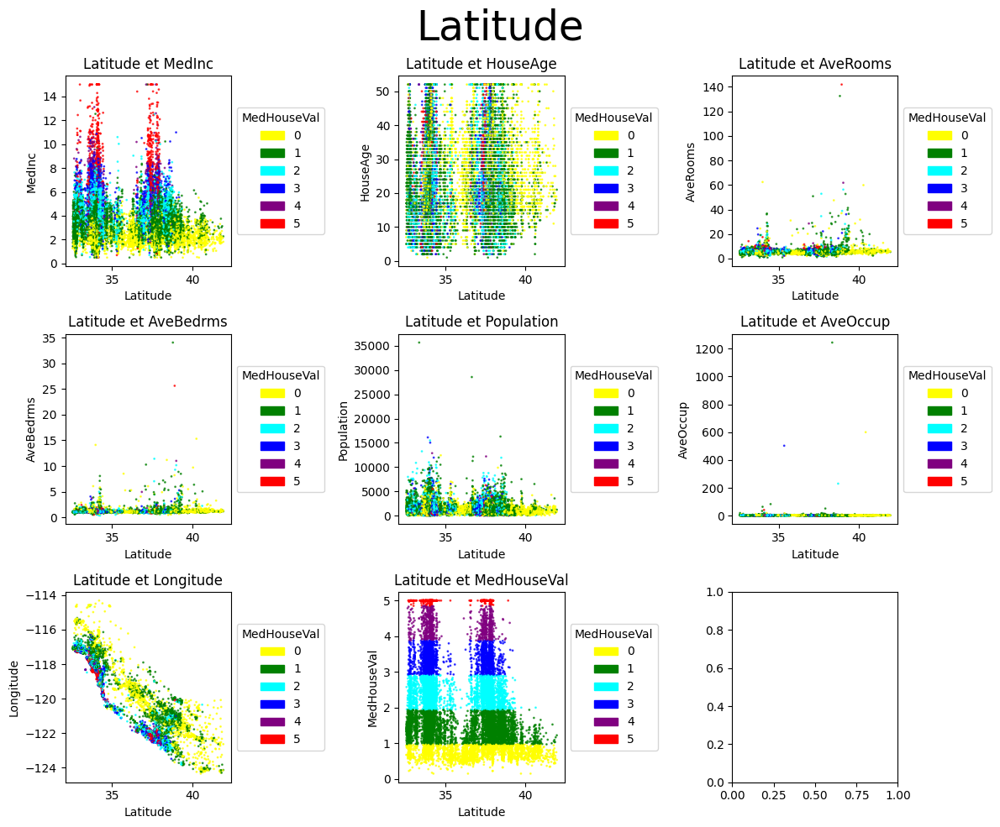

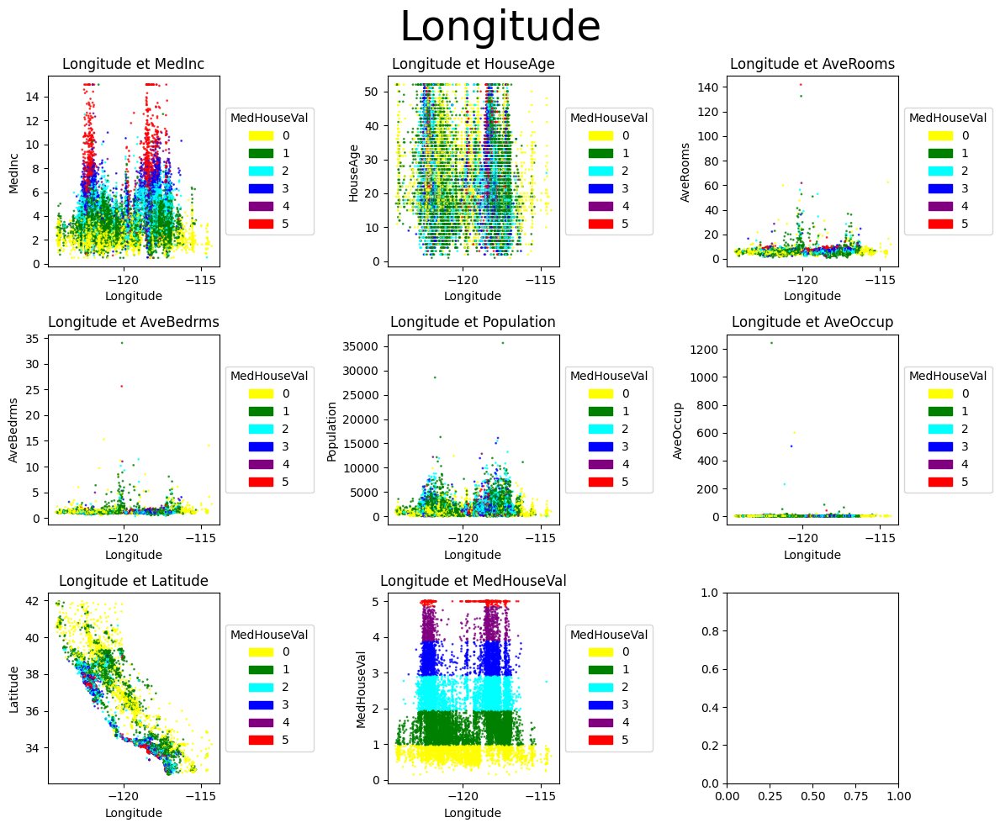

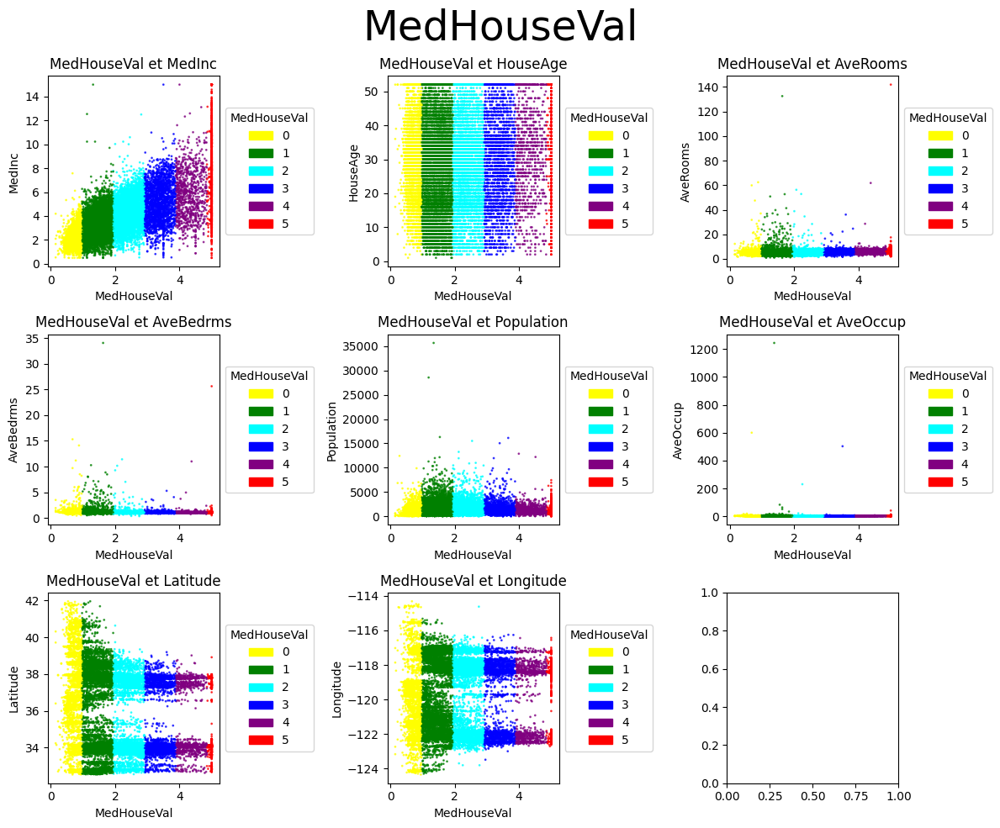

In [83]:
if REFRESHPLOTS:
    CreateAllPlotOfDatabase(dataset_cal_housing, "MedHouseVal", ["yellow", "green", "cyan", "blue", "purple", "red"])

# ANALYSE
**Medic & MedHouseVal**

on peut tracer une droite => évolution proportionnel entre ces deux valeurs

**Latitude & Longitude**

Plus on est proche de la côte, plus la valeur de l'appartement est cher,
On remarque qu'il y a 2 zones rouges qui correspondent à San Francisco (& San José) & Los Angeles (+ Sacramento pour des maisons ou medhouseval > 80)
=> On pourrait rajouter la distance entre chacune des deux villes
=> Rajouter une distance par rapport à la côte

**Les Extrêmes**
populations (env. 10 valeurs à supprimer)
AveBedrms (env 7 grosses valeurs)
AveRooms (entre 2 et 10 valleurs à supprimer)

# Suppression des valeurs extrêmes non effectué mais envisageable

# Ajout d'une nouvelle liste

**Distance entre la ville la plus proche**


In [84]:
import geopy.distance

def KmDistanceBtw2LocsWiLatLon(coords1, coords2):
    return geopy.distance.distance(coords1, coords2).km

citiesList = [
[37.761757, -122.474577], # San Francisco,
[38.572392, -121.497334], # Sacramento,
[37.337981, -121.885107], # San Jose,
[34.080060, -118.424558] # Los Angeles
]

def AddNewArrayBasedOnCityDistance(originaldataset, cities):
    """Adds new row to the originaldataset Dataframe"""
    DistanceToCityList = list()
    for index in range(len(originaldataset["Latitude"])):
        minDistance = 99999999
        for city in cities:
            distanceFromCity = KmDistanceBtw2LocsWiLatLon(city, [originaldataset["Latitude"][index], originaldataset["Longitude"][index]])
            minDistance = min(minDistance, distanceFromCity)
        DistanceToCityList.append(minDistance)
    df = pd.DataFrame({"DistanceToCity" : DistanceToCityList})
    return pd.concat([originaldataset, df], axis=1, ignore_index=False)
    

In [85]:
if USESAVEDDATASET:
    new_datasetCal_housing = load("DataSave/new_datasetCal_housing")
else:
    new_datasetCal_housing = AddNewArrayBasedOnCityDistance(dataset_cal_housing, citiesList).drop(["HouseAge", "AveOccup", "AveBedrms"], axis = 1)
    dump(new_datasetCal_housing, "DataSave/new_datasetCal_housing") 
print(new_datasetCal_housing)

       MedInc  AveRooms  Population  Latitude  Longitude  MedHouseVal  \
0      8.3252  6.984127       322.0     37.88    -122.23        4.526   
1      8.3014  6.238137      2401.0     37.86    -122.22        3.585   
2      7.2574  8.288136       496.0     37.85    -122.24        3.521   
3      5.6431  5.817352       558.0     37.85    -122.25        3.413   
4      3.8462  6.281853       565.0     37.85    -122.25        3.422   
...       ...       ...         ...       ...        ...          ...   
20635  1.5603  5.045455       845.0     39.48    -121.09        0.781   
20636  2.5568  6.114035       356.0     39.49    -121.21        0.771   
20637  1.7000  5.205543      1007.0     39.43    -121.22        0.923   
20638  1.8672  5.329513       741.0     39.43    -121.32        0.847   
20639  2.3886  5.254717      1387.0     39.37    -121.24        0.894   

       DistanceToCity  
0           25.218119  
1           24.928769  
2           22.861930  
3           22.069429  
4  

# Data de la nouvelle table

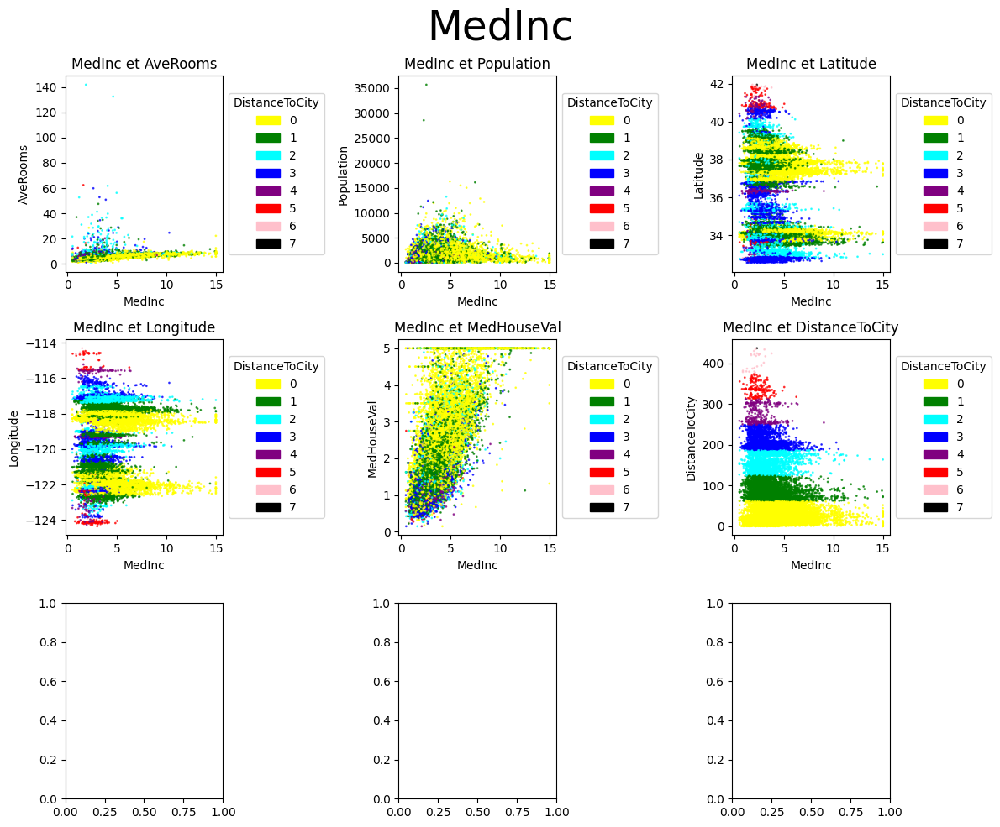

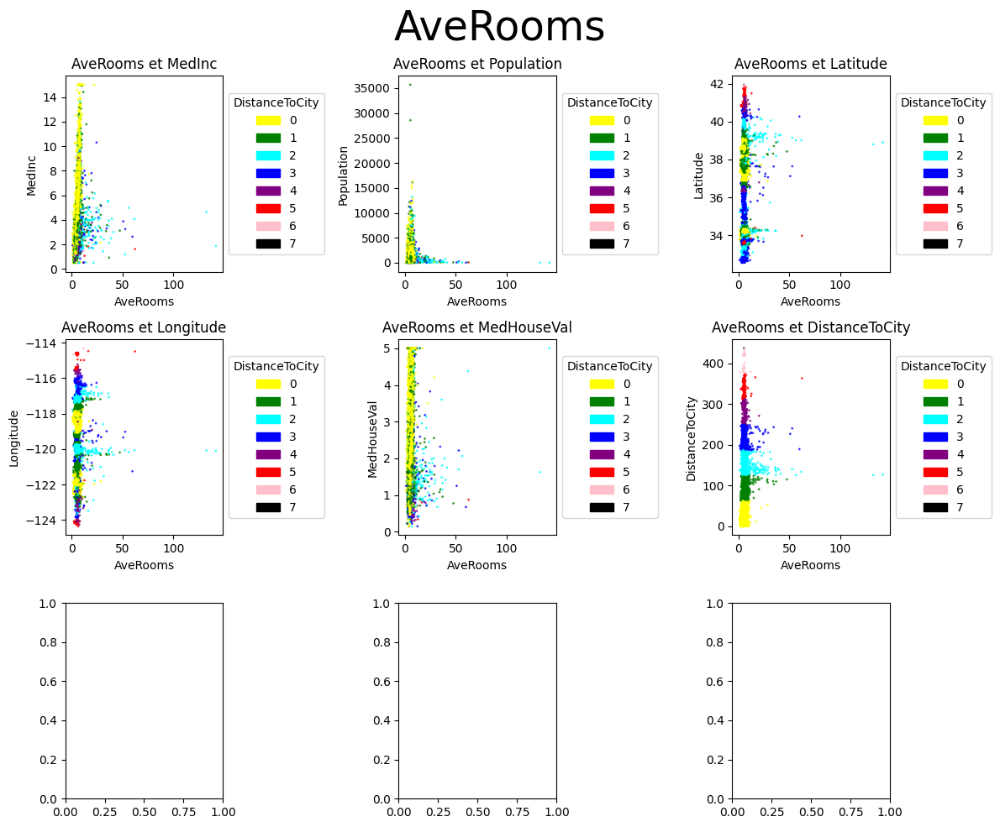

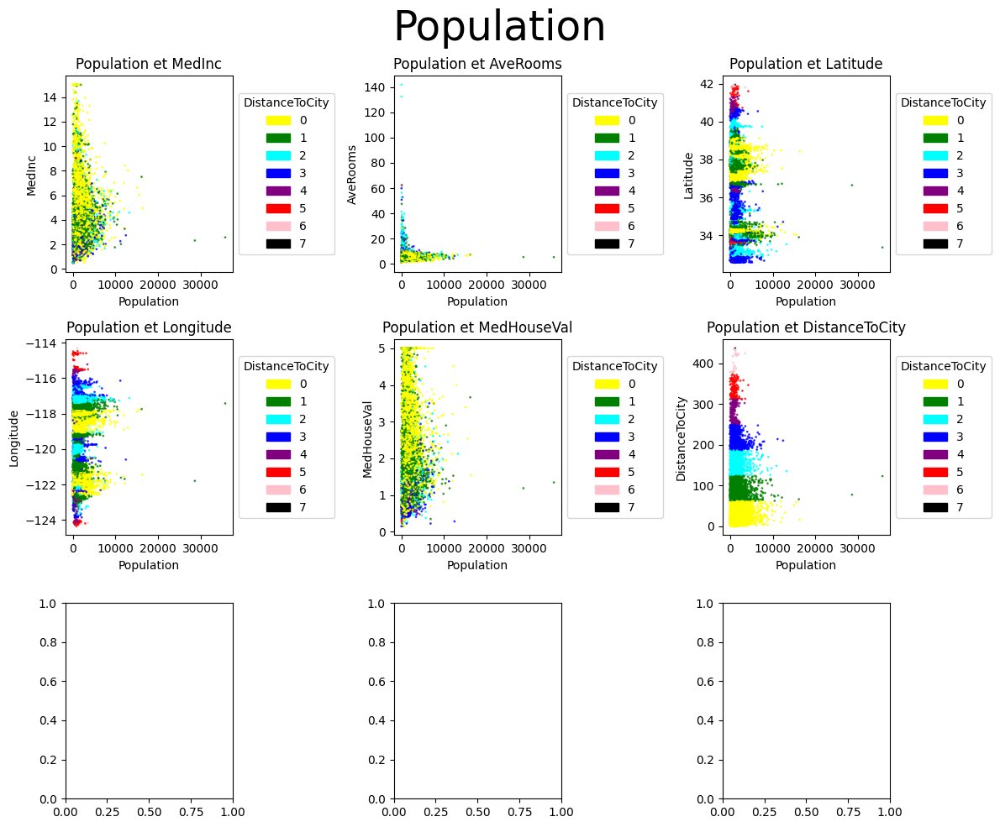

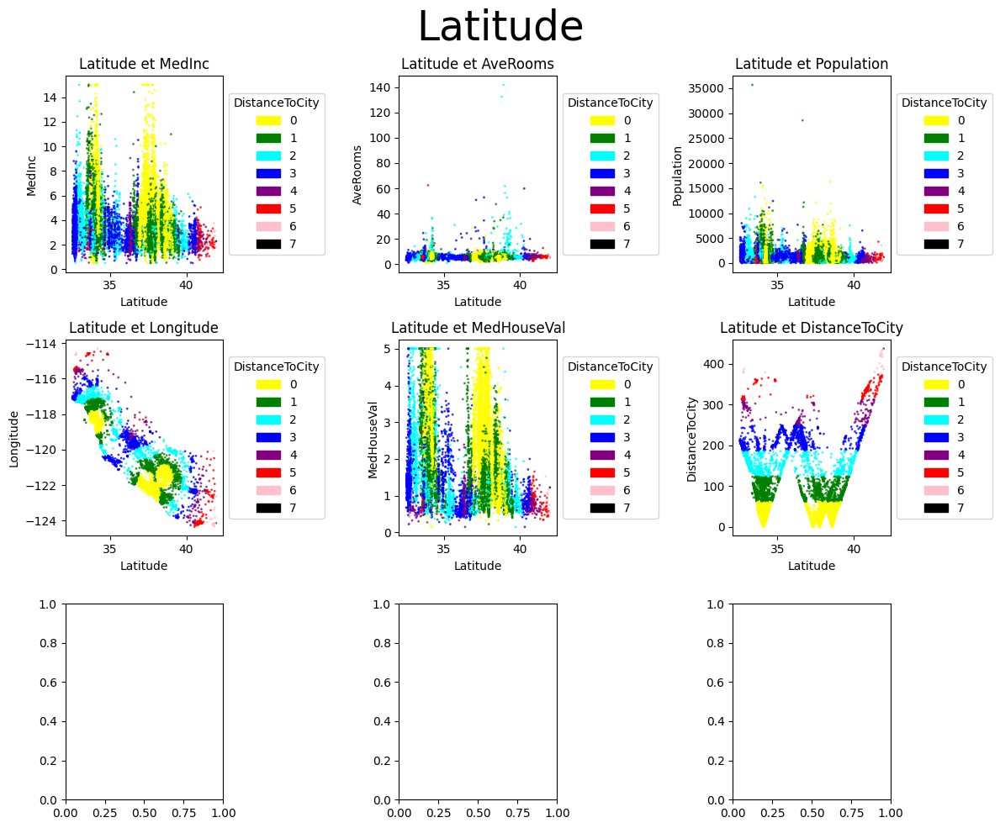

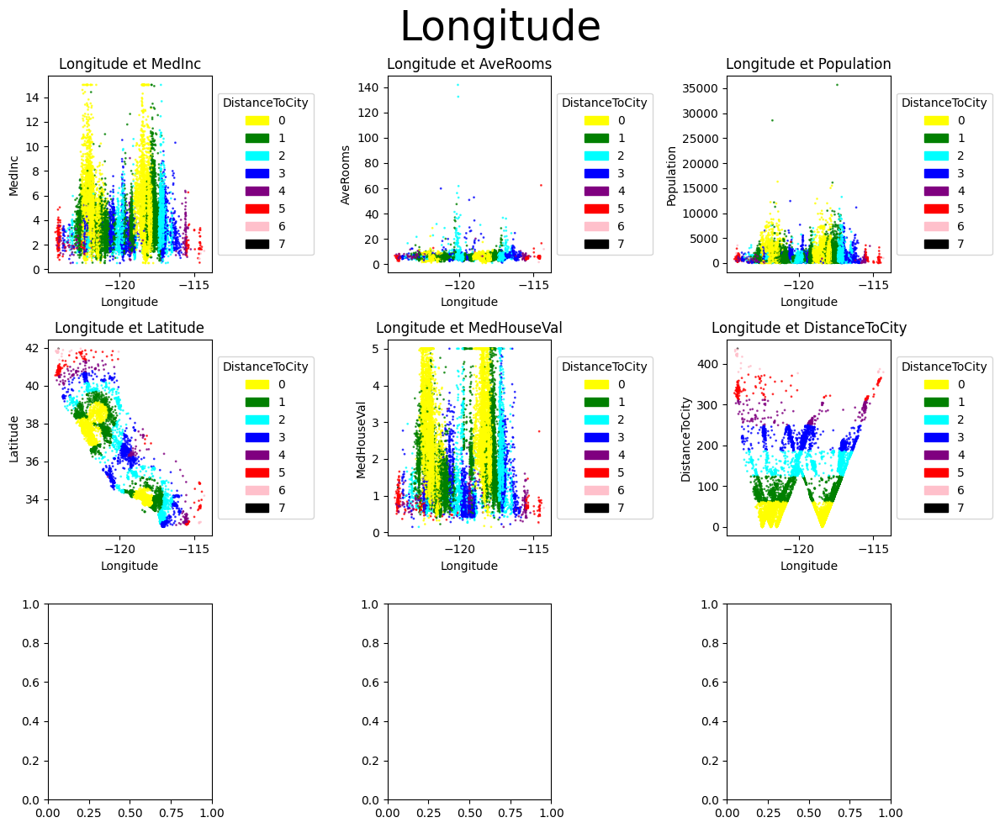

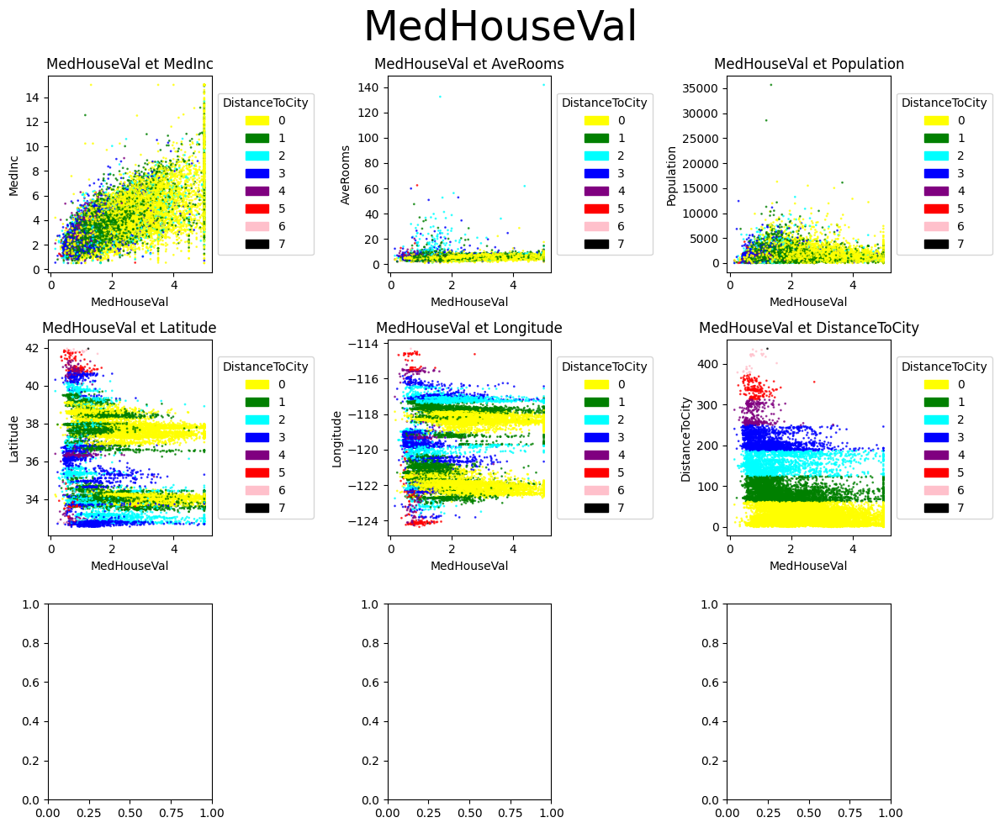

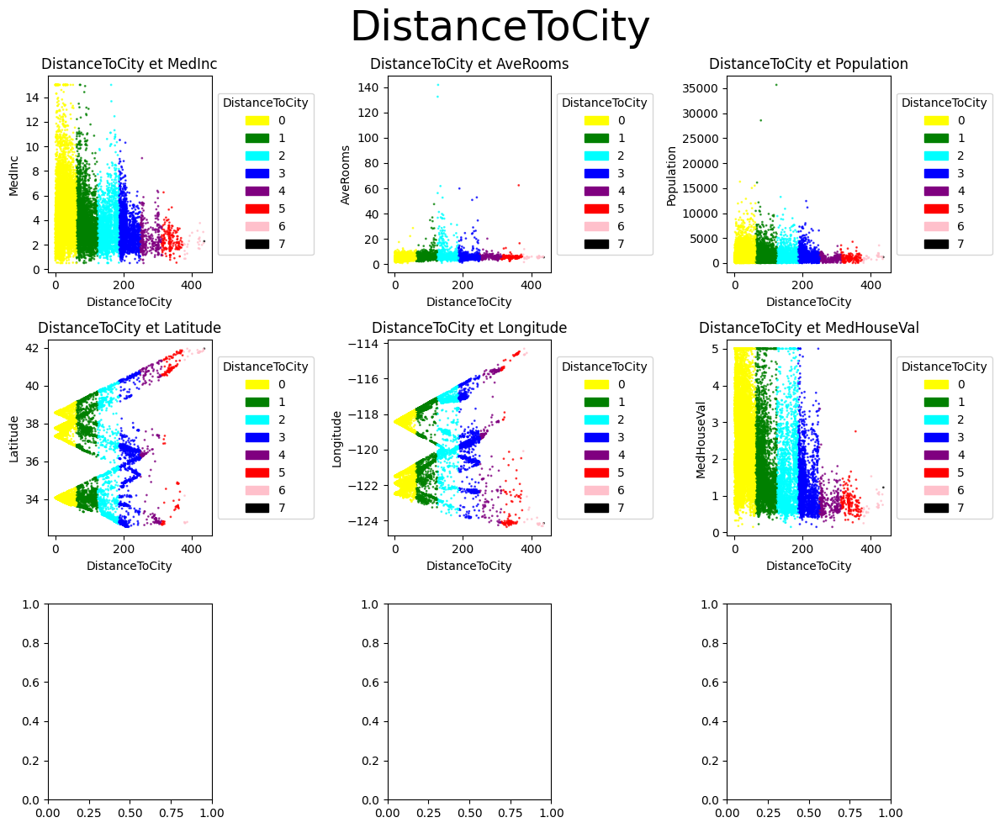

In [86]:

if REFRESHPLOTS:
    CreateAllPlotOfDatabase(new_datasetCal_housing, "DistanceToCity", ["yellow", "green", "cyan", "blue", "purple", "red", "pink", "black"])

# Test du dataframe avec la distance aux villes

In [87]:
if TESTING:
    CompleteTestForDataset(new_datasetCal_housing)

# Ajout des distances aux côtes

Anciennes fonctions avec le .shp qui n'a pas marché

Les calculs n'ont jamais donné de données cohérentes

Les autres arguments sont notés dans la nouvelle partie qui calcule une distance cohérente par rapport aux côtes

In [88]:
if False:
    import geopandas as gpd
    import numpy as np
    import os
    from shapely.ops import nearest_points, cascaded_union, transform
    from shapely.geometry import Polygon, LinearRing, Point, LineString
    import pyproj
    from shapely.geometry import Point
    # Data téléchargées sur le site 
    # https://www.ngdc.noaa.gov/mgg/shorelines/data/gshhg/latest/
    # INFO Sur les données utilisées dans notre cas il s'agissait des L1 en h ou f 
    # GSHHG combines the older GSHHS shoreline database with WDBII rivers and borders, available in either ESRI shapefile format or in a native binary format. 
    # Geography data are in five resolutions: crude(c), low(l), intermediate(i), high(h), and full(f). Shorelines are organized into four levels: boundary between land and ocean (L1), 
    # boundary between lake and land (L2), boundary between island-in-lake and lake (L3), and boundary between pond-in-island and island (L4). 
    # Datasets are in WGS84 geographic (simple latitudes and longitudes; decimal degrees).
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
    us = world[world['name']=='United States of America'].dissolve(by='name')
    coastline = gpd.clip(gpd.read_file('./ShoreLinesUs/GSHHS_l_L1.shp').buffer(0).to_crs('EPSG:4326'), us).to_crs('EPSG:3857')
    def getDistanceFromShore(ShoreLine, long, lat):
        wgs84 = pyproj.CRS('EPSG:4326')
        usa = pyproj.CRS('EPSG:3857')
        translation = pyproj.Transformer.from_crs(wgs84, usa, always_xy=True).transform
        # ShoreLine.to_crs('EPSG:3857')
        transformed_point = transform(translation, Point(long, lat))
        distance = ShoreLine.geometry.exterior.distance(transformed_point)
        return distance[distance > 0.01].min()/500.0

    def AddNewArrayBasedOnShoreDistance(originaldataset, ShoreLine):
        """Adds new row to the originaldataset Dataframe"""
        DistanceToShoreList = list()
        for index in range(len(originaldataset["Latitude"])):
            DistanceToShoreList.append(getDistanceFromShore(ShoreLine, originaldataset["Longitude"][index], originaldataset["Latitude"][index]))
            print(index, "/", len(originaldataset["Latitude"]), end="\r")
        df = pd.DataFrame({"DistanceToShore" : DistanceToShoreList})
        return pd.concat([originaldataset, df], axis=1, ignore_index=False)

### Nouvelle version fonctionnelle
Nous avons manuellement avec google maps enregistré des points qui forment la côtes de la californie

Nous nous retrouvons avec beaucoup d'avantages que nous n'avions pas sur la méthodes précédentes : 

    Un contrôle et une compréhension total des données ainsi qu'une implémentation beaucoup plus simple

La valeur de distance correspond à la longueur en latitude et longitude : 

Les conversions en mètres ou autres n'ont pas étés effectués par simplicité et elles n'entachent en rien les données et leur précision.
L'optimisation a elle aussi été un grand argument (3min de moins avec cette nouvelle méthode)


In [89]:
from shapely.geometry import LineString, LinearRing, Point
from shapely.ops import nearest_points
import matplotlib.pyplot as plt
import geopandas as gpd  

shorePoints = [
    (32.538216, -117.119791),
    (32.551218, -117.126830),
    (32.608230, -117.134370),
    (32.671106, -117.167011),
    (32.666492, -117.241737),
    (32.800052, -117.258494),
    (32.807751, -117.267642),
    (32.822037, -117.281010),
    (32.842996, -117.281289),
    (32.851340, -117.273799),
    (32.849005, -117.264514),
    (32.875617, -117.251349),
    (33.001120, -117.278022),
    (33.033752, -117.291757),
    (33.036662, -117.295834),
    (33.123288, -117.329284),
    (33.386265, -117.592522),
    (33.461530, -117.679321),
    (33.460027, -117.714536),
    (33.483630, -117.726469),
    (33.542253, -117.785904),
    (33.554514, -117.818855),
    (33.606772, -117.928043),
    (33.621507, -117.942660),
    (33.730449, -118.089271),
    (33.742015, -118.114891),
    (33.761497, -118.157936),
    (33.705859, -118.290700),
    (33.727462, -118.351559),
    (33.737427, -118.360788),
    (33.742287, -118.384223),
    (33.741235, -118.411150),
    (33.780257, -118.423884),
    (33.817783, -118.389681),
    (33.843503, -118.393391),
    (33.962326, -118.453732),
    (34.039632, -118.547376),
    (34.004322, -118.807083),
    (34.035221, -118.857329),
    (34.099656, -119.121876),
    (34.144548, -119.199226),
    (34.146310, -119.216439),
    (34.262977, -119.274135),
    (34.415008, -119.561384),
    (34.396460, -119.709693),
    (34.396327, -119.729632),
    (34.418379, -119.792352),
    (34.404581, -119.844511),
    (34.407002, -119.877923),
    (34.435503, -119.927231),
    (34.435096, -119.954072),
    (34.461856, -120.016878),
    (34.473699, -120.144435),
    (34.445393, -120.454742),
    (34.542898, -120.542314),
    (34.577467, -120.648296),
    (34.710378, -120.601188),
    (34.755989, -120.637246),
    (34.861689, -120.611094),
    (34.880426, -120.638733),
    (34.901294, -120.647646),
    (34.902911, -120.671306),
    (35.062654, -120.627665),
    (35.149049, -120.652736),
    (35.177254, -120.751399),
    (35.160970, -120.757478),
    (35.208586, -120.856138),
    (35.255964, -120.897247),
    (35.367170, -120.863174),
    (35.418974, -120.876970),
    (35.449216, -120.908197),
    (35.461221, -121.003384),
    (35.636672, -121.166167),
    (35.664612, -121.284195),
    (35.695403, -121.293214),
    (35.714136, -121.314972),
    (35.756176, -121.317957),
    (35.782801, -121.331895),
    (35.888936, -121.462726),
    (36.000528, -121.502700),
    (36.019937, -121.566810),
    (36.175843, -121.696039),
    (36.305735, -121.897351),
    (36.342467, -121.893205),
    (36.356849, -121.906630),
    (36.397919, -121.905613),
    (36.448442, -121.929150),
    (36.454088, -121.925009),
    (36.489871, -121.942379),
    (36.521053, -121.952967),
    (36.523604, -121.926602),
    (36.562911, -121.935489),
    (36.567453, -121.949681),
    (36.560924, -121.952350),
    (36.569687, -121.970912),
    (36.581127, -121.978090),
    (36.582662, -121.967443),
    (36.609942, -121.957334),
    (36.609374, -121.949601),
    (36.637399, -121.934708),
    (36.600824, -121.882499),
    (36.692506, -121.810800),
    (36.805942, -121.789001),
    (36.943035, -121.872698),
    (36.978893, -121.937013),
    (36.954376, -121.975214),
    (36.963027, -122.022268),
    (36.951139, -122.026854),
    (36.956900, -122.105800),
    (37.232728, -122.412707),
    (37.360685, -122.401446),
    (37.433181, -122.442542),
    (37.477840, -122.450114),
    (37.500134, -122.470024),
    (37.503694, -122.486210),
    (37.495587, -122.495301),
    (37.522833, -122.517436),
    (37.567085, -122.514621),
    (37.593417, -122.519060),
    (37.597845, -122.503225),
    (37.664943, -122.494686),
    (37.783390, -122.512993),
    (37.806585, -122.401179),
    (37.415420, -122.006118),
    (37.453739, -121.944215),
    (37.953946, -122.409718),
    (38.052758, -122.247230),
    (38.135072, -122.408981),
    (38.113222, -122.485940),
    (37.827485, -122.481301),
    (38.033385, -122.947724),
    (38.238150, -122.964165),
    (38.342253, -123.064907),
    (38.452829, -123.130956),
    (38.510490, -123.250367),
    (38.547924, -123.303519),
    (38.555662, -123.303855),
    (38.565856, -123.332913),
    (38.596853, -123.349502),
    (38.918575, -123.724199),
    (39.053976, -123.690637),
    (39.348199, -123.823543),
    (39.436693, -123.817067),
    (39.561028, -123.765648),
    (39.603345, -123.788476),
    (39.667999, -123.791801),
    (39.710069, -123.807376),
    (39.723470, -123.830240),
    (39.832849, -123.852055),
    (39.859830, -123.904034),
    (39.910521, -123.930598),
    (39.923521, -123.955437),
    (40.016739, -124.041702),
    (40.024338, -124.064708),
    (40.031541, -124.080211),
    (40.066570, -124.079492),
    (40.105138, -124.110751),
    (40.130596, -124.186409),
    (40.257970, -124.360776),
    (40.314671, -124.347664),
    (40.438448, -124.408903),
    (40.500164, -124.383135),
    (40.503254, -124.386958),
    (41.026428, -124.110725),
    (41.057422, -124.147682),
    (41.140719, -124.147420),
    (41.403846, -124.066398),
    (41.532921, -124.081918),
    (41.738500, -124.161106),
    (41.746205, -124.200949),
    (41.782485, -124.253080),
    (41.935126, -124.203596),
    (41.997330, -124.211037),
    (41.999484, -124.211976)
]
# On relie tout les points en LineString afin de pouvoir calculer en grande simplicité
CalShoreline = LineString(shorePoints)

### Nouvelle fonction de calcul de distances aux côtes
Simple et efficace

In [90]:
def getDistanceFromShore(ShoreLine, long, lat):
    return ShoreLine.distance(Point(lat, long))

def AddNewArrayBasedOnShoreDistance(originaldataset, ShoreLines):
    DistanceToShoreList = list()
    for index in range(len(originaldataset["Latitude"])):
        DistanceToShoreList.append(getDistanceFromShore(ShoreLines, originaldataset["Longitude"][index], originaldataset["Latitude"][index]))
    df = pd.DataFrame({"DistanceToShore" : DistanceToShoreList})
    return pd.concat([originaldataset, df], axis=1, ignore_index=False)

In [91]:
if USESAVEDDATASET:
    Shore_new_datasetCal_housing = load("DataSave/Shore_new_datasetCal_housing")
else:
    Shore_new_datasetCal_housing = AddNewArrayBasedOnShoreDistance(new_datasetCal_housing, CalShoreline)
    dump(Shore_new_datasetCal_housing, "DataSave/Shore_new_datasetCal_housing") 

print(Shore_new_datasetCal_housing)

       MedInc  AveRooms  Population  Latitude  Longitude  MedHouseVal  \
0      8.3252  6.984127       322.0     37.88    -122.23        4.526   
1      8.3014  6.238137      2401.0     37.86    -122.22        3.585   
2      7.2574  8.288136       496.0     37.85    -122.24        3.521   
3      5.6431  5.817352       558.0     37.85    -122.25        3.413   
4      3.8462  6.281853       565.0     37.85    -122.25        3.422   
...       ...       ...         ...       ...        ...          ...   
20635  1.5603  5.045455       845.0     39.48    -121.09        0.781   
20636  2.5568  6.114035       356.0     39.49    -121.21        0.771   
20637  1.7000  5.205543      1007.0     39.43    -121.22        0.923   
20638  1.8672  5.329513       741.0     39.43    -121.32        0.847   
20639  2.3886  5.254717      1387.0     39.37    -121.24        0.894   

       DistanceToCity  DistanceToShore  
0           25.218119         0.081185  
1           24.928769         0.074881  


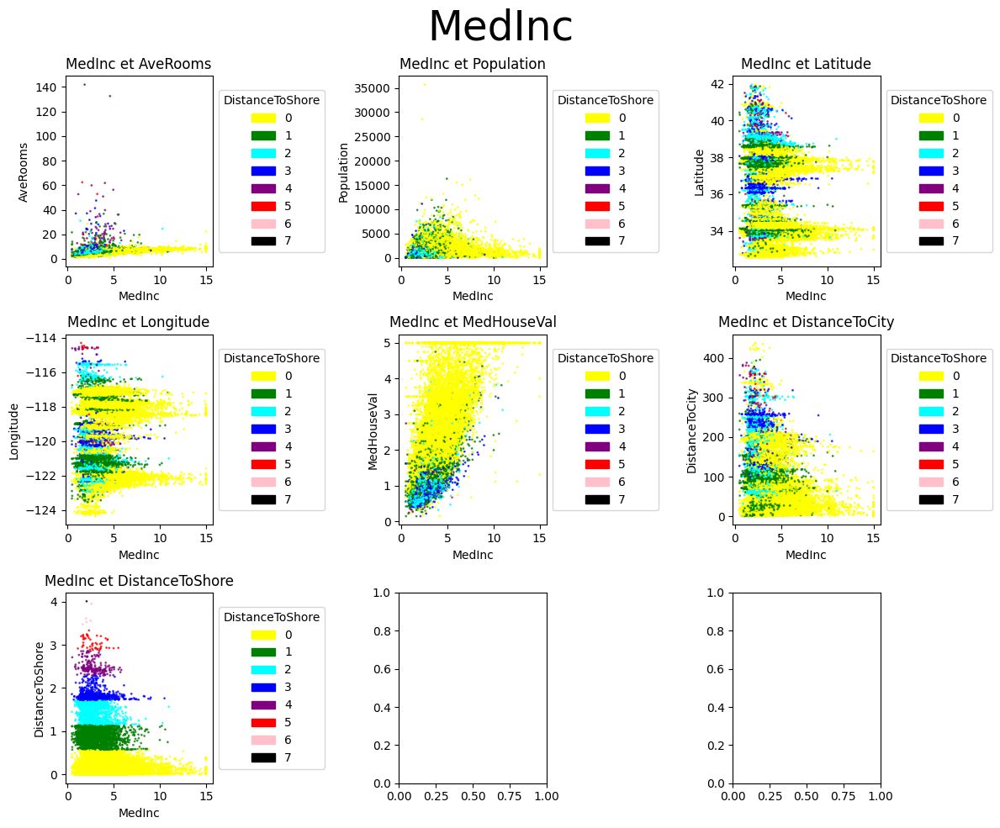

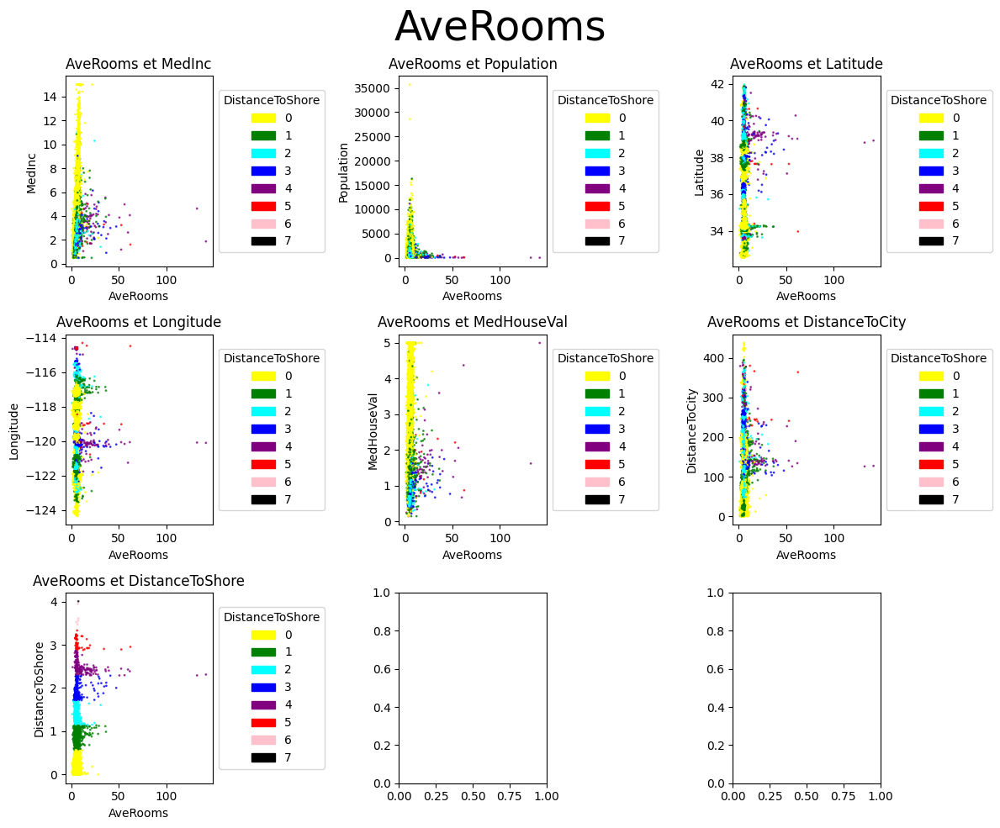

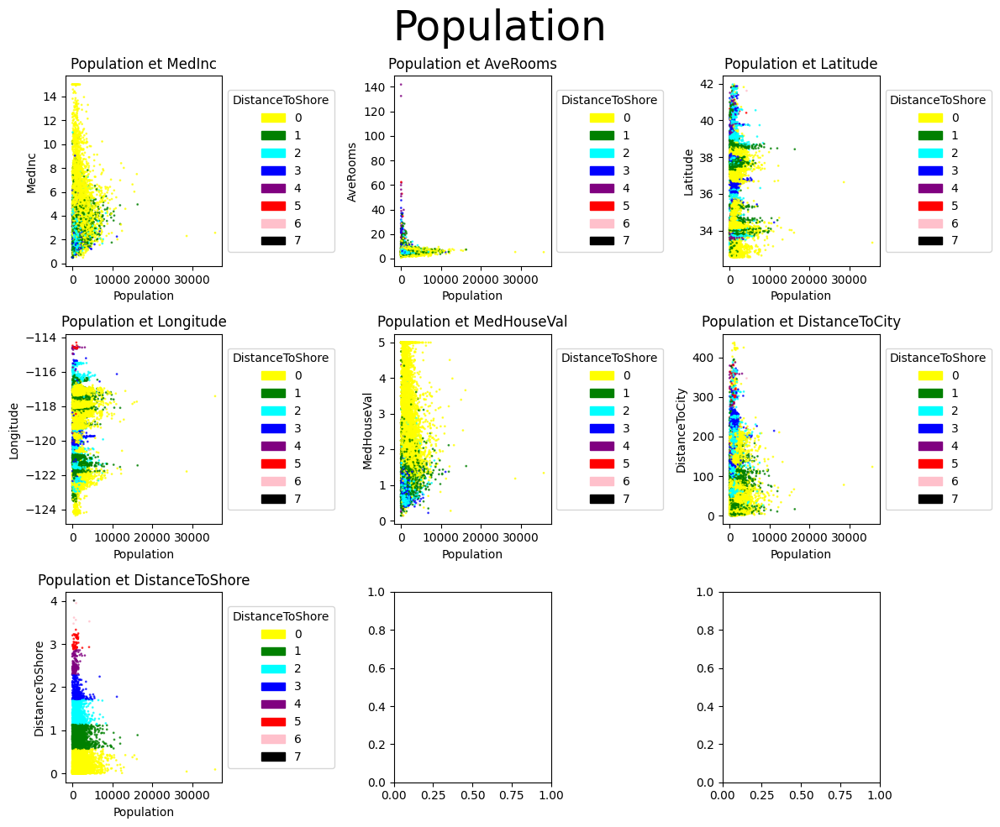

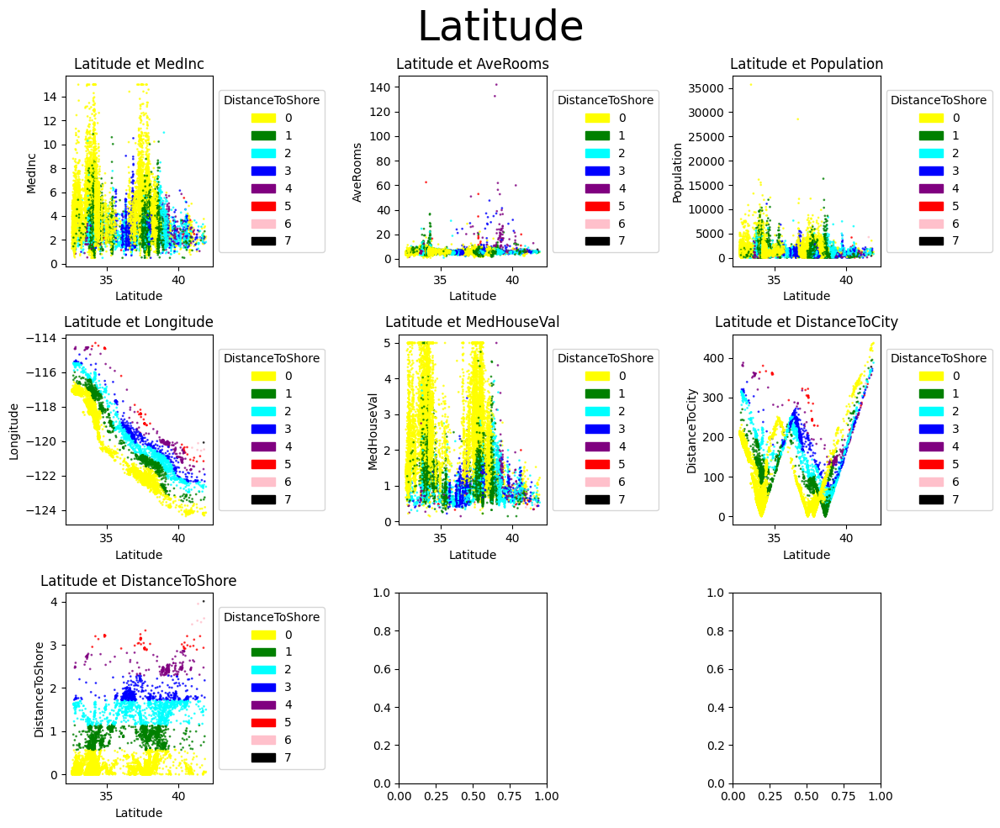

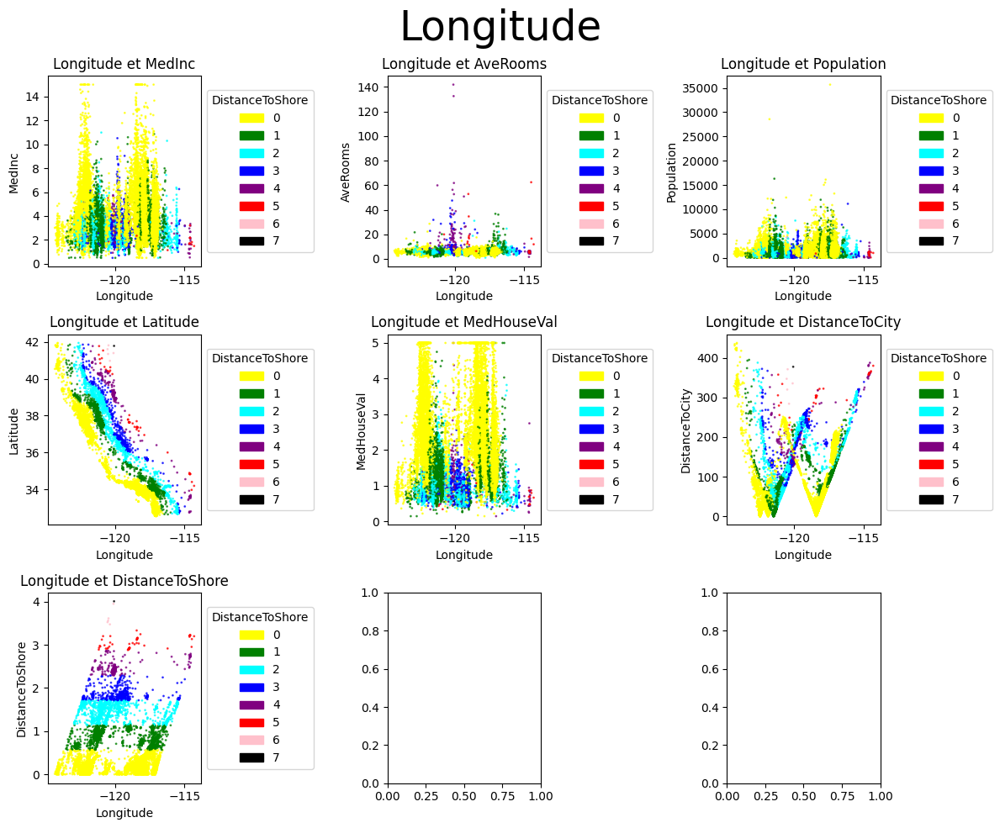

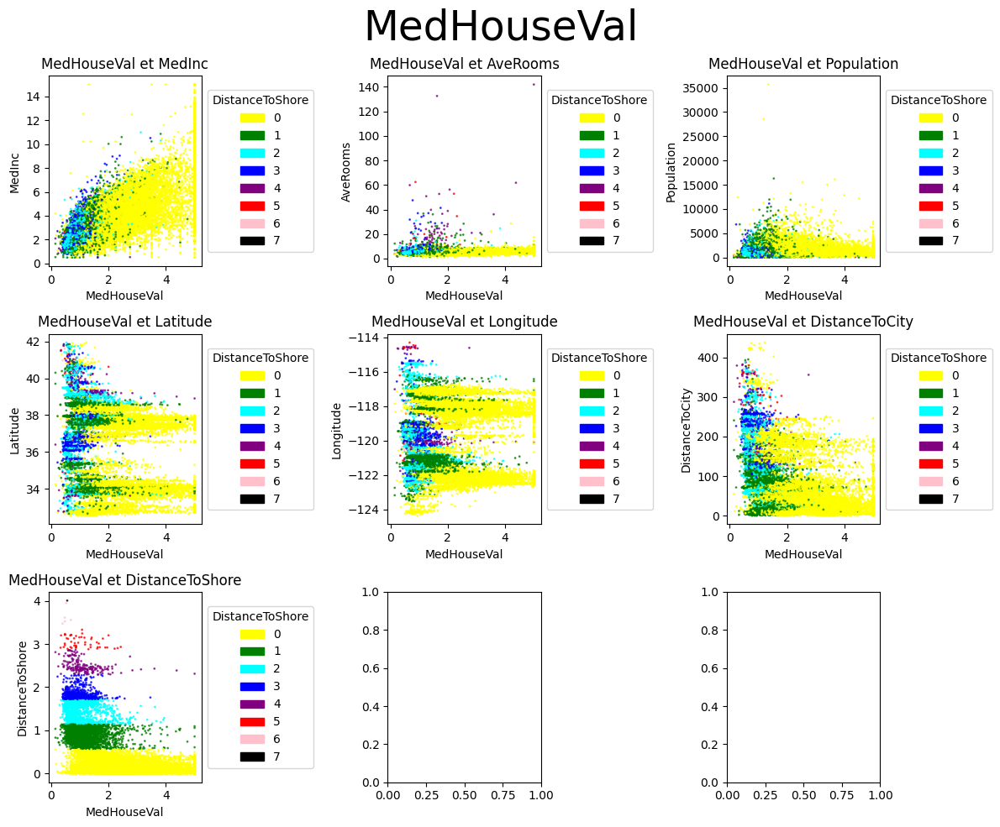

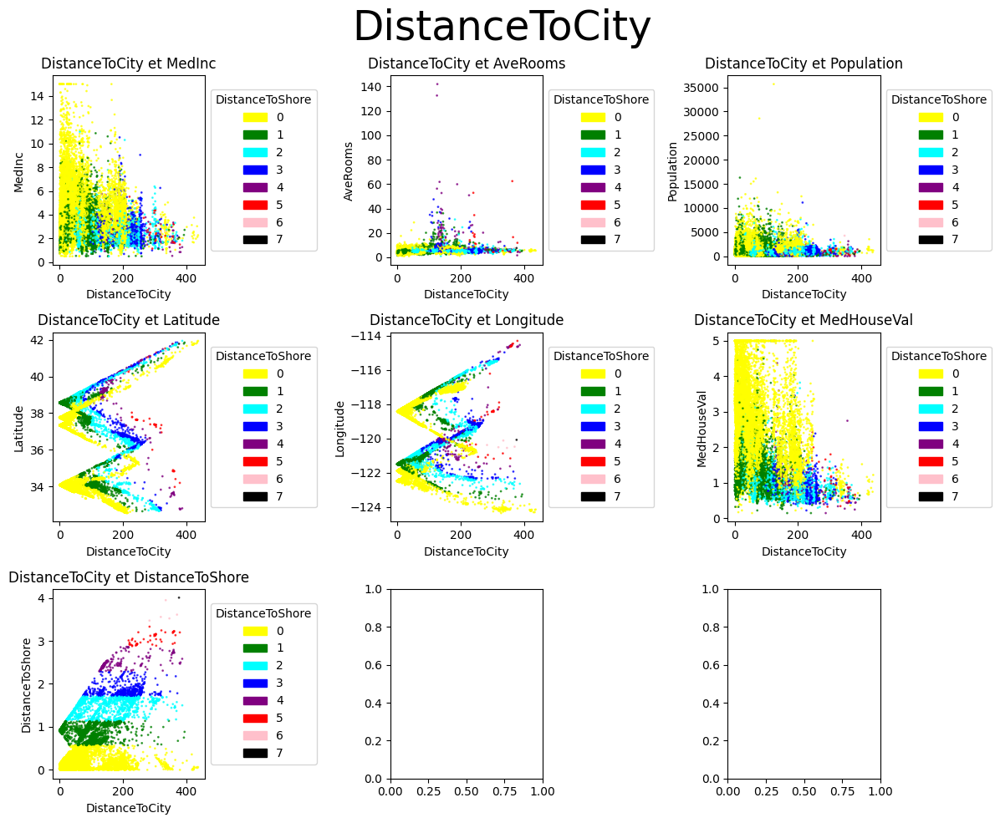

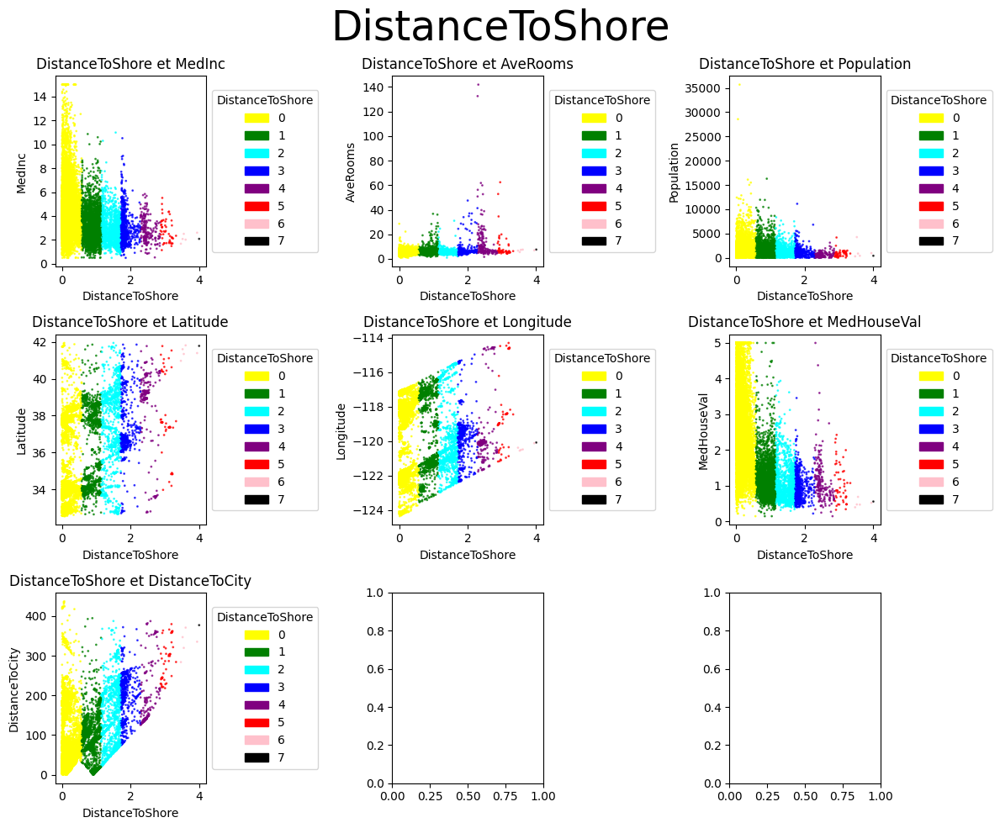

In [92]:
if REFRESHPLOTS:
    CreateAllPlotOfDatabase(Shore_new_datasetCal_housing, "DistanceToShore", ["yellow", "green", "cyan", "blue", "purple", "red", "pink", "black"])

In [93]:
if TESTING:
    CompleteTestForDataset(Shore_new_datasetCal_housing)

# Ajout de l'altitude pour agmenter les données qui peuvent avoir du potentiel

In [94]:
import requests
import time
def GetElevationWithAPI(latitude, longitude):
    r = requests.get("https://api.open-elevation.com/api/v1/lookup?locations=" + str(latitude) + "," + str(longitude))
    time.sleep(0.1)
    if r.status_code == 429:
        time.sleep(0.25)
        return GetElevationWithAPI(latitude, longitude)
    return r.json()["results"][0]["elevation"]

def AddNewArrayBasedOnElevation(originaldataset):
    ElevationValueList = list()
    for index in range(len(originaldataset["Latitude"])):
        ElevationValueList.append(GetElevationWithAPI(originaldataset["Latitude"][index], originaldataset["Longitude"][index]))
        print(index, "/", len(originaldataset["Latitude"]), end="\r")
    df = pd.DataFrame({"Elevation" : ElevationValueList})
    return pd.concat([originaldataset, df], axis=1, ignore_index=False)

In [95]:
if USESAVEDDATASET:
    Elevation_new_dataset = load("DataSave/Elevation_new_dataset")
else:
    Elevation_new_dataset = AddNewArrayBasedOnElevation(Shore_new_datasetCal_housing)
    dump(Elevation_new_dataset, "DataSave/Elevation_new_dataset")
print(Elevation_new_dataset)

       MedInc  AveRooms  Population  Latitude  Longitude  MedHouseVal  \
0      8.3252  6.984127       322.0     37.88    -122.23        4.526   
1      8.3014  6.238137      2401.0     37.86    -122.22        3.585   
2      7.2574  8.288136       496.0     37.85    -122.24        3.521   
3      5.6431  5.817352       558.0     37.85    -122.25        3.413   
4      3.8462  6.281853       565.0     37.85    -122.25        3.422   
...       ...       ...         ...       ...        ...          ...   
20635  1.5603  5.045455       845.0     39.48    -121.09        0.781   
20636  2.5568  6.114035       356.0     39.49    -121.21        0.771   
20637  1.7000  5.205543      1007.0     39.43    -121.22        0.923   
20638  1.8672  5.329513       741.0     39.43    -121.32        0.847   
20639  2.3886  5.254717      1387.0     39.37    -121.24        0.894   

       DistanceToCity  DistanceToShore  Elevation  
0           25.218119         0.081185        491  
1           24.9287

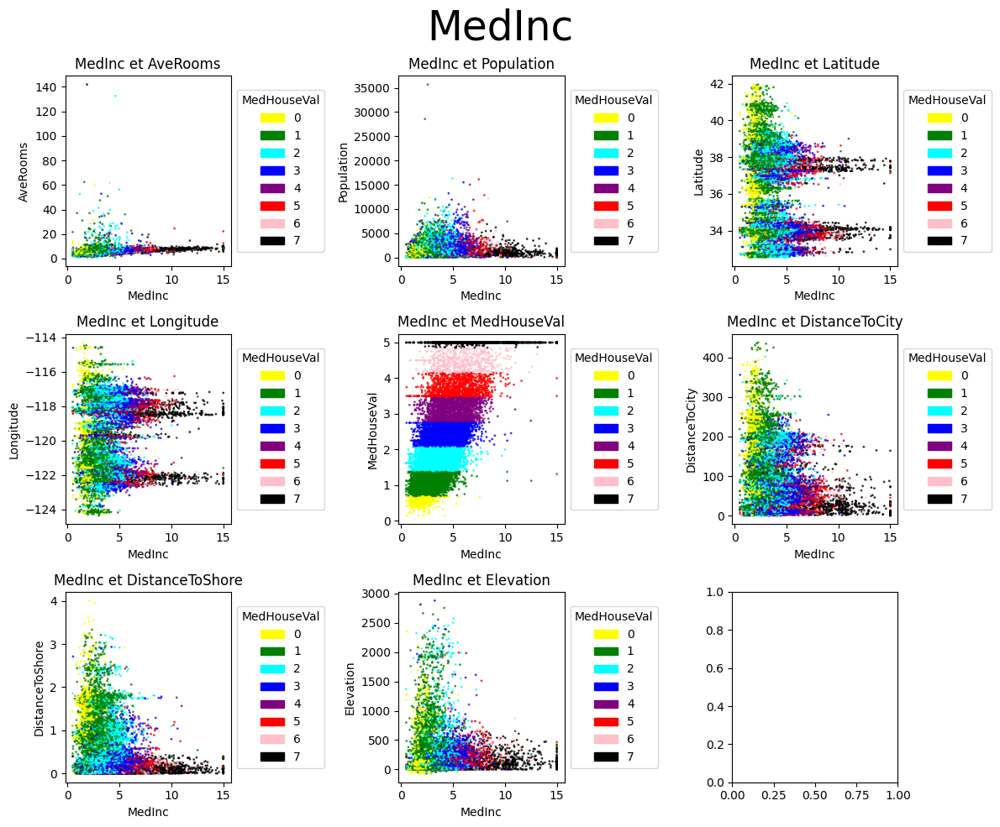

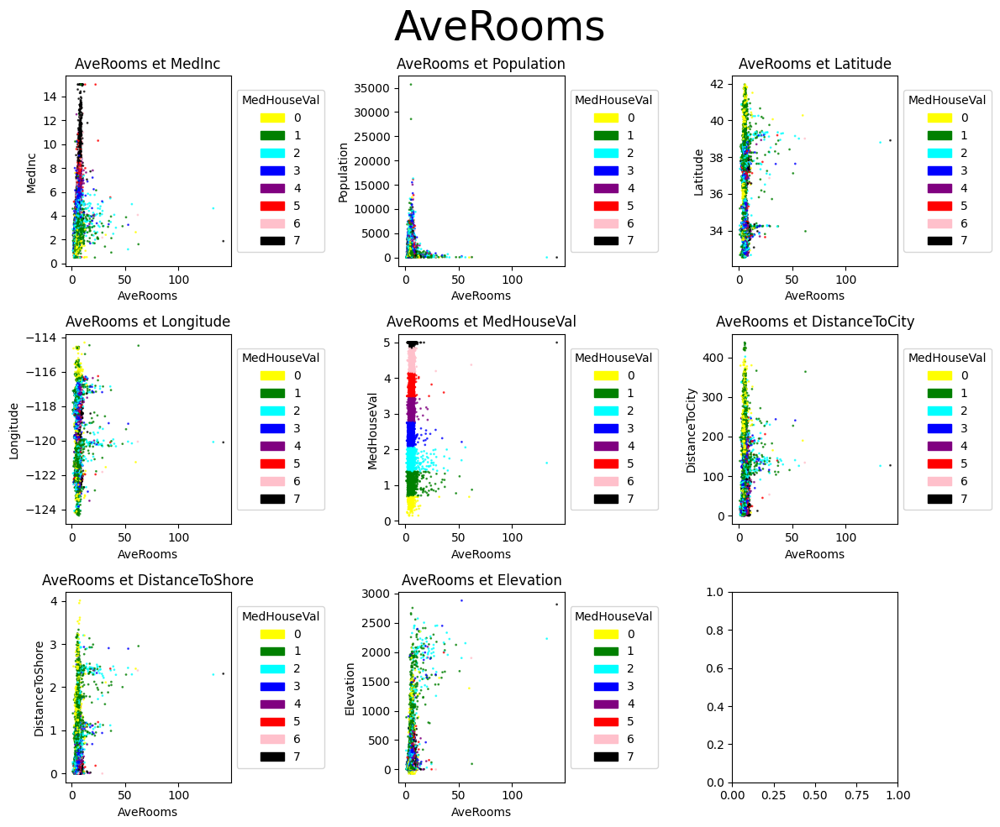

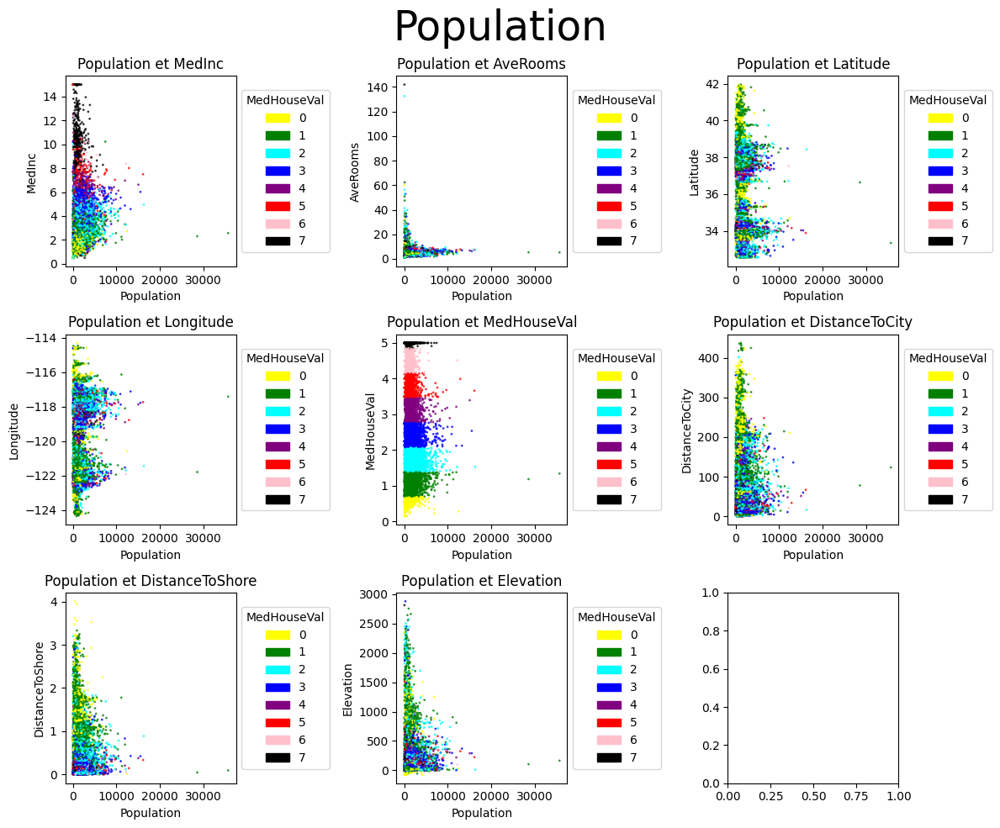

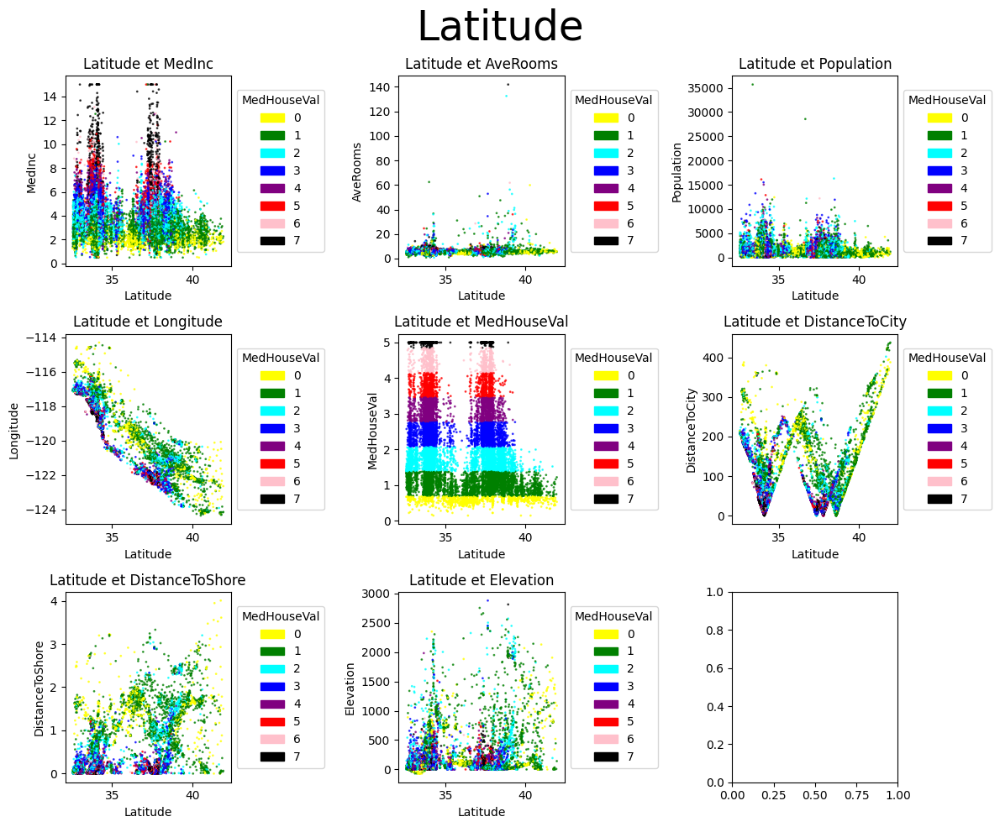

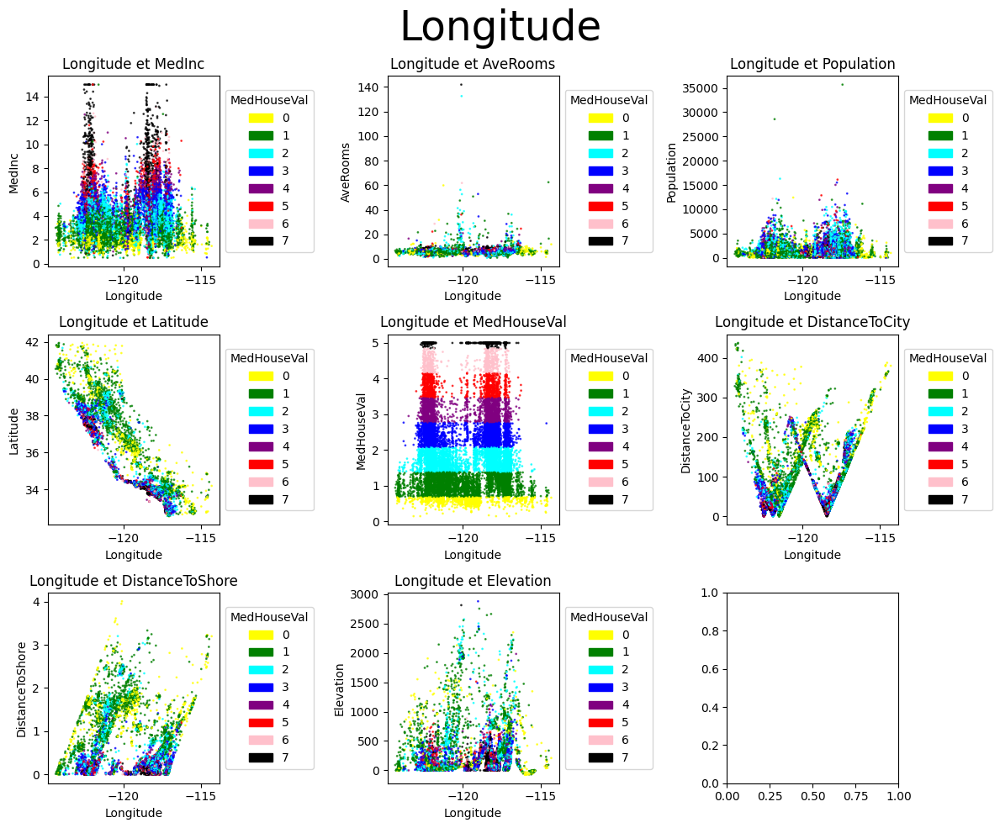

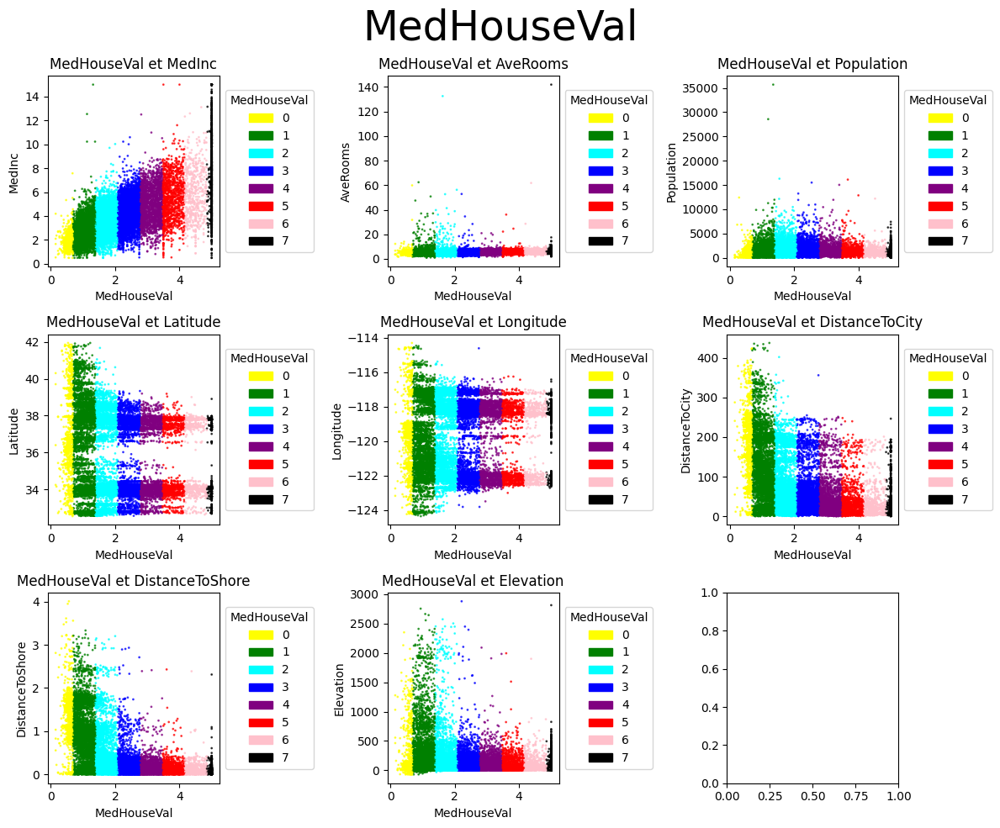

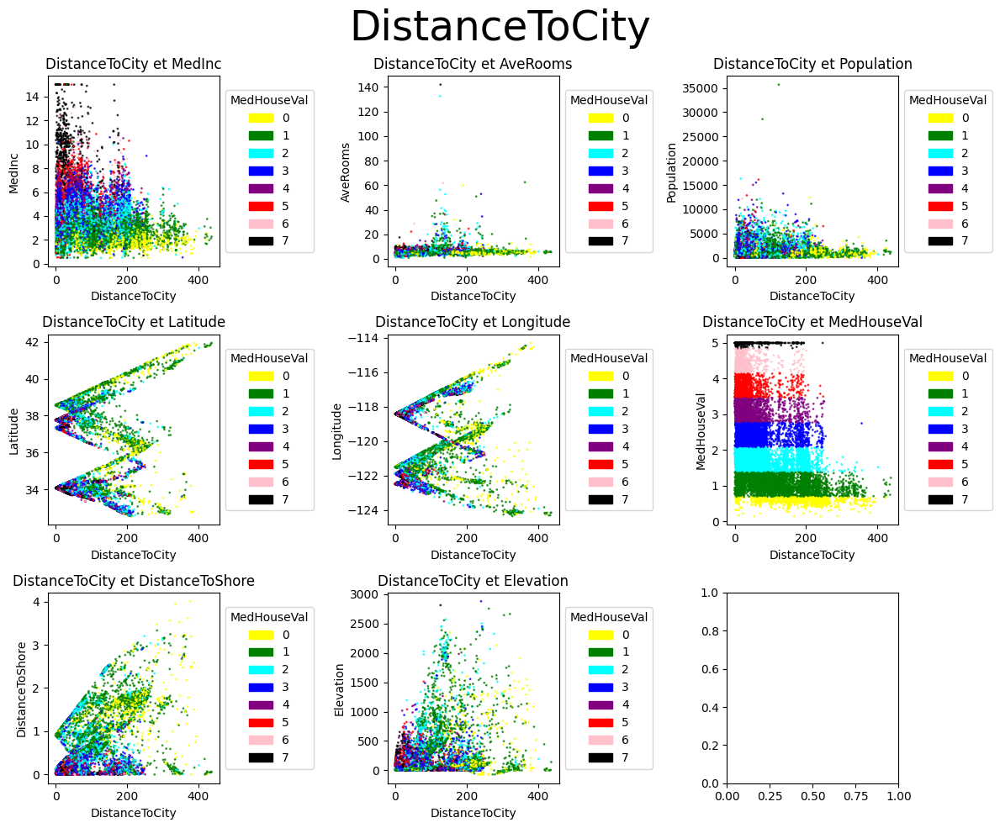

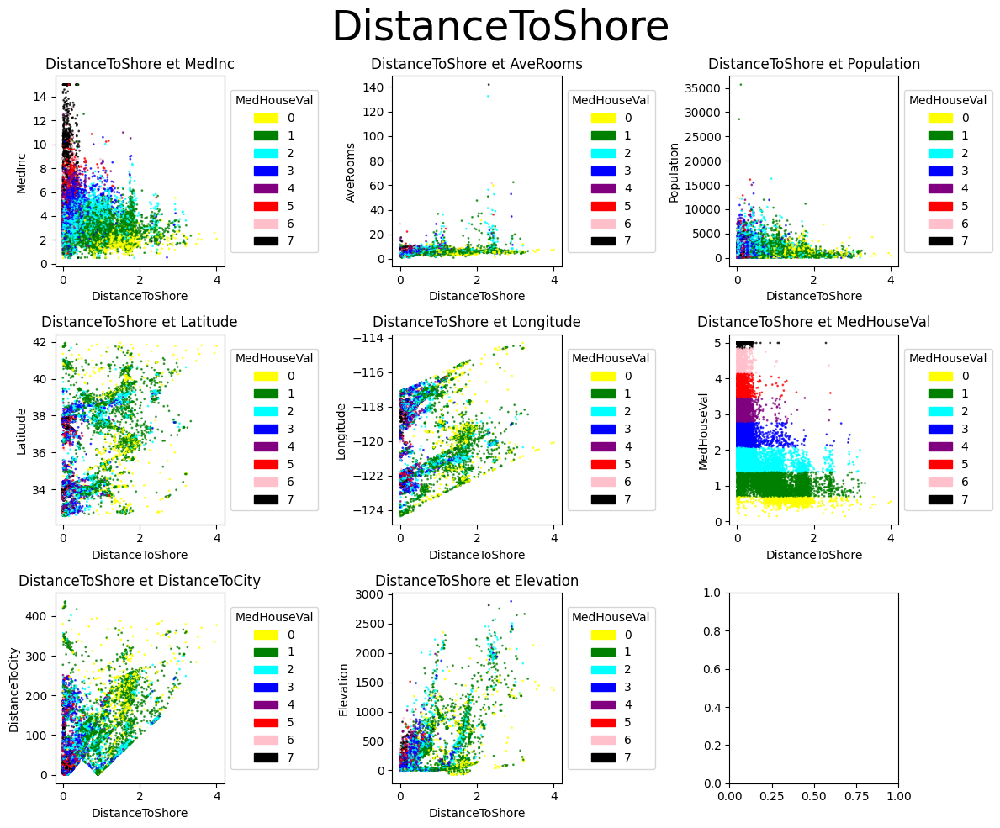

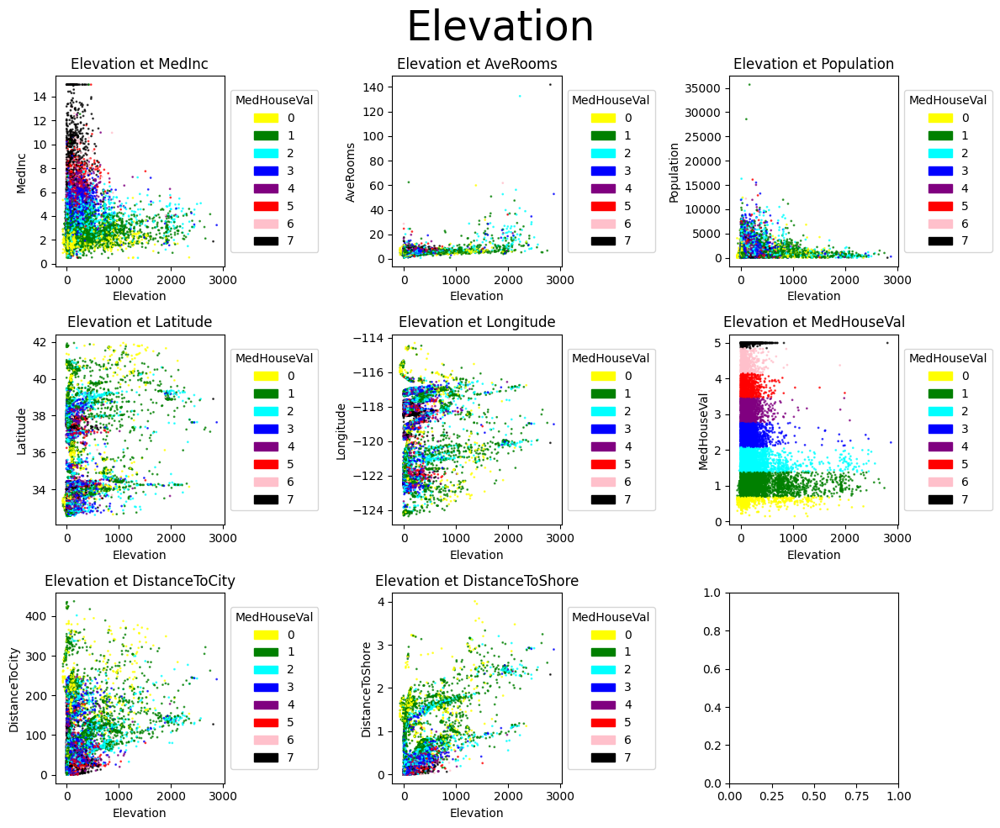

In [96]:
if REFRESHPLOTS:
    CreateAllPlotOfDatabase(Elevation_new_dataset, "MedHouseVal", ["yellow", "green", "cyan", "blue", "purple", "red", "pink", "black"])

In [119]:
SoftTestForDataset(Elevation_new_dataset)

{'Regressor': 'ExtraTreesRegressor', 'Score': 0.8476968411797429}

In [143]:
if TESTING:
    CompleteTestForDataset(Elevation_new_dataset)

In [160]:
from sklearn.tree import ExtraTreeRegressor, DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor, ExtraTreesRegressor, AdaBoostRegressor, HistGradientBoostingRegressor

Test d'éventuelles nouvelles combinaisons

In [121]:
list_Of_Dataset_Key = ["AveRooms", "Population", "Latitude", "Longitude", "Elevation"]
from itertools import chain, combinations
def all_subsets(ss):
    return chain(*map(lambda x: combinations(ss, x), range(0, len(ss)+1)))

maxScore = {"Regressor" : "none", "Score" : 0}
bestSubSet = ()
for subset in all_subsets(list_Of_Dataset_Key):
    # if len(subset) < 1:
    #     continue
    print("\n", list(subset))
    tempMax = SoftTestForDataset(Elevation_new_dataset.drop(list(subset), axis = 1), softDebug=True)
    if tempMax["Score"] > maxScore["Score"]:
        maxScore = tempMax
        bestSubSet = subset
        print(maxScore["Regressor"], ":", maxScore["Score"], " | On drop tables : ", bestSubSet) # , end="\r"
print("\nFinal Results")
print(maxScore)
print(bestSubSet)


 []
ExtraTreesRegressor : 0.8423347899302541  | On drop tables :  ()
 ['AveRooms']
SVR score : 0.183468401385836357287212679223702523490401
 ['Population']
SVR score : 0.441267474773107246913499215314711968824222
 ['Latitude']
SVR score : 0.184698293807422988714877077160489733799812
 ['Longitude']
SVR score : 0.19471306407147992620394601244760218155579
 ['Elevation']
ExtraTreesRegressor : 0.8425746844777073  | On drop tables :  ('Elevation',)
 ['AveRooms', 'Population']
SVR score : 0.437906826403777549004711550780891240192278
 ['AveRooms', 'Latitude']
SVR score : 0.189317484057507483290361704804026292020981
 ['AveRooms', 'Longitude']
SVR score : 0.182077019116914653345746716208445763671135
 ['AveRooms', 'Elevation']
SVR score : 0.178167219904080136098392889688974391387668
 ['Population', 'Latitude']
SVR score : 0.46967036607100726796455812780146288122135
 ['Population', 'Longitude']
ExtraTreesRegressor : 0.8511152663064826  | On drop tables :  ('Population', 'Longitude')
 ['Population

16  Regressor Used
PLSRegression score : 0.538266915166196
RandomForestRegressor score : 0.8116164822506763
ExtraTreesRegressor score : 0.8193314993752852
BaggingRegressor score : 0.7977090645822592
GradientBoostingRegressor score : 0.7945880272561502
AdaBoostRegressor score : 0.575299012209475
HistGradientBoostingRegressor score : 0.8386018868932261
ARDRegression score : 0.6114817583067087
LinearRegression score : 0.6186576072066494
PassiveAggressiveRegressor score : 0
SGDRegressor score : 0
TheilSenRegressor score : 0
MLPRegressor score : 0.5161086872087361
DecisionTreeRegressor score : 0.6056493826697296
ExtraTreeRegressor score : 0.5315928384987711
SVR score : 0.030874566332014908


{'Regressor': 'HistGradientBoostingRegressor', 'Score': 0.8386018868932261}

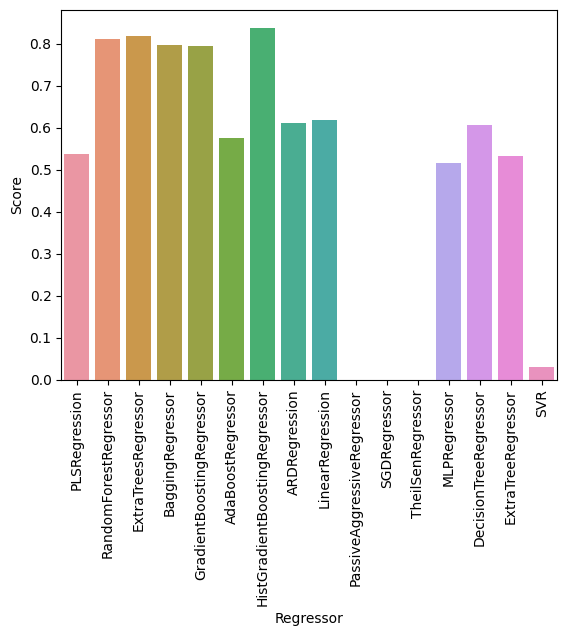

In [149]:
SoftTestForDataset(dataset_cal_housing, softDebug=False)

16  Regressor Used
PLSRegression score : 0.5568920198558083
RandomForestRegressor score : 0.8369888885234998
ExtraTreesRegressor score : 0.8336393120589963
BaggingRegressor score : 0.8190901996442533
GradientBoostingRegressor score : 0.7626834622099457
AdaBoostRegressor score : 0.5538343754688555
HistGradientBoostingRegressor score : 0.8259241266292126
ARDRegression score : 0.5752839328892663
LinearRegression score : 0.5980888317376223
PassiveAggressiveRegressor score : 0.4699010830484678
SGDRegressor score : 0
TheilSenRegressor score : 0.5791219415609553
MLPRegressor score : 0.5809037861530795
DecisionTreeRegressor score : 0.7007317130659778
ExtraTreeRegressor score : 0.6452871931167894
SVR score : 0.17785059649943114


{'Regressor': 'RandomForestRegressor', 'Score': 0.8369888885234998}

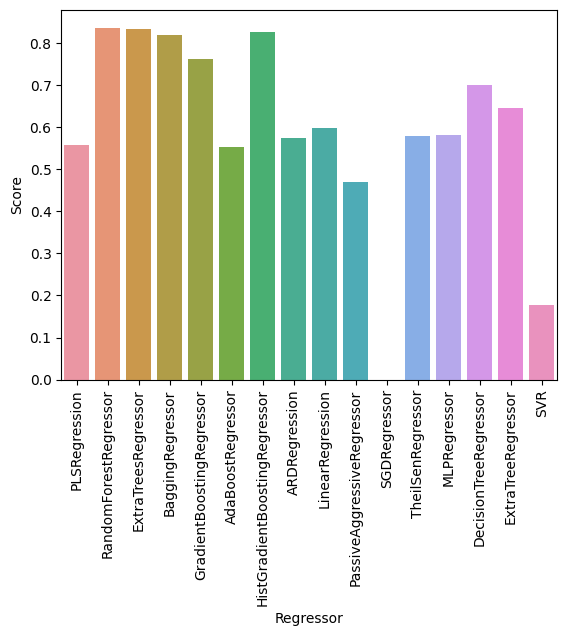

In [139]:
SoftTestForDataset(new_datasetCal_housing, softDebug=False)

16  Regressor Used
PLSRegression score : 0.5926516849350072
RandomForestRegressor score : 0.8261085363667551
ExtraTreesRegressor score : 0.8310606057697226
BaggingRegressor score : 0.8118513224356868
GradientBoostingRegressor score : 0.7733514913221827
AdaBoostRegressor score : 0.5664893451092201
HistGradientBoostingRegressor score : 0.82271534880099
ARDRegression score : 0.5857342822840597
LinearRegression score : 0.6045675854502934
PassiveAggressiveRegressor score : 0.4731482424928094
SGDRegressor score : 0
TheilSenRegressor score : 0.5676391444732807
MLPRegressor score : 0.6071058779527719
DecisionTreeRegressor score : 0.6729353149577609
ExtraTreeRegressor score : 0.6426328946775149
SVR score : 0.17607037985499452


{'Regressor': 'ExtraTreesRegressor', 'Score': 0.8310606057697226}

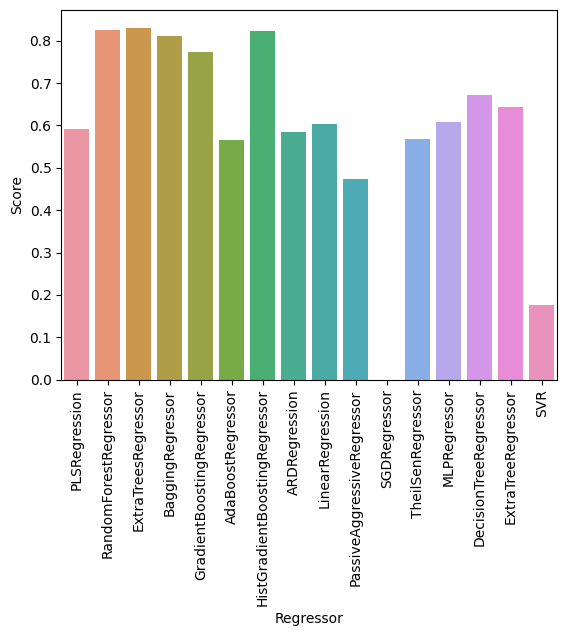

In [140]:
SoftTestForDataset(Shore_new_datasetCal_housing, softDebug=False)

16  Regressor Used
PLSRegression score : 0.5762775723558271
RandomForestRegressor score : 0.8437570452102288
ExtraTreesRegressor score : 0.8499856409304398
BaggingRegressor score : 0.8283771518035535
GradientBoostingRegressor score : 0.7866327679468992
AdaBoostRegressor score : 0.5895287418964195
HistGradientBoostingRegressor score : 0.8424230612567067
ARDRegression score : 0.5820318193837831
LinearRegression score : 0.6009349836503848
PassiveAggressiveRegressor score : 0.39152941855192025
SGDRegressor score : 0
TheilSenRegressor score : 0.5616072075499128
MLPRegressor score : 0.4799049574145321
DecisionTreeRegressor score : 0.704249626292321
ExtraTreeRegressor score : 0.6807858665859752
SVR score : 0.17994097407859344


{'Regressor': 'ExtraTreesRegressor', 'Score': 0.8499856409304398}

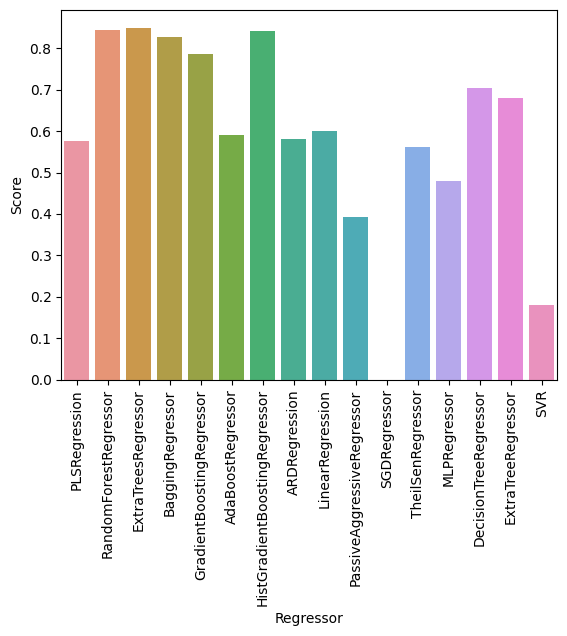

In [141]:
SoftTestForDataset(Elevation_new_dataset, softDebug=False)

# Résultats Final de l'IA
## Modèle utilisé : ExtraTreesRegressor
## Dataset utilisé : Elevation_new_dataset

In [159]:
params_Grid = {'n_estimators': 140, 'random_state': 69}
reg = ExtraTreesRegressor(**params_Grid)
x_Final_Test, y_Final_Test, x_Final_Train, y_Final_Train = GetTestAndTrain(dataset=Elevation_new_dataset)
reg.fit(x_Final_Train, y_Final_Train)
dump(reg, "DataSave/FinalFittedAI")

predict = reg.predict(x_Final_Test)
print(explained_variance_score(y_Final_Test, predict))

0.8502651254790794
